In [ ]:
folder = "VirtualValtteri"
# This one is me doing laps around the kitchen
filename = "VirtualValtteri.vmkarting.2023-03-20-01-50-58.csv"
sensors = {
    'rotation': 'android.sensor.rotation_vector',
    'acceleration': 'Earth.Linear_Acceleration',
}



In [ ]:
import pandas as pd
from google.colab import drive
import numpy as np

ROWS=0
COLS=1
drive.mount('/content/drive')
fullpath = '/content/drive/MyDrive/' + folder +"/"+ filename
# This version unnecesarily returned 16 floats from EarthAccelerationSensor. We only use 4.
names=['timestamp','type','sensortype','vendor','version','x','y','z','zz','quality','zz2','zz3','zz4','zz5','zz6','zz7','zz8','zz9','zz69','zz699','zz6999','zz69999','zz699099','zz6999999','zz69999199','z9z6','zz6999999999']
dts={'timestamp':np.int64, 'type':int, 'sensortype':str, 'version':int, 'x':np.float64,'y':np.float64,'z':np.float64,'zz':np.float64}
alldata = pd.read_csv(fullpath,names=names, usecols=[0,2]+list(range(5,11)),dtype=dts)
# Doesn't work
#alldata.drop(['type','vendor','version'],axis='columns')

#alldata = alldata.drop(labels=names[11:],axis=COLS)
alldata.head(15)

Mounted at /content/drive


,timestamp,sensortype,x,y,z,zz,quality,zz2
0,1000968935568587,android.sensor.linear_acceleration,0.000000,0.000000,0.000000,NaN,NaN,NaN
1,1000968940557025,android.sensor.linear_acceleration,-0.002837,0.009153,-0.054935,NaN,NaN,NaN
2,1000968945545462,android.sensor.linear_acceleration,-0.003194,0.029019,-0.163866,NaN,NaN,NaN
3,1000968950533900,android.sensor.linear_acceleration,-0.002683,0.040206,-0.262260,NaN,NaN,NaN
4,1000968955522337,android.sensor.linear_acceleration,0.000769,0.025054,-0.323834,NaN,NaN,NaN
5,1000968960510775,android.sensor.linear_acceleration,0.017040,0.009580,-0.394504,NaN,NaN,NaN
6,1000968965499212,android.sensor.linear_acceleration,0.023027,0.017440,-0.484822,NaN,NaN,NaN
7,1000968970487650,android.sensor.linear_acceleration,0.036762,0.018794,-0.561389,NaN,NaN,NaN
8,1000968975476087,android.sensor.linear_acceleration,0.030256,0.029620,-0.683228,NaN,NaN,NaN
9,1000968980464525,android.sensor.linear_acceleration,0.020430,0.034333,-0.790931,NaN,NaN,NaN


In [ ]:
pd.options.display.width = 200
#last curve missing. artificially copy end lalst curve of firts lap
print(alldata["timestamp"].max(),alldata["timestamp"].min())
start=int(alldata["timestamp"].size*0.43)
end=int(alldata["timestamp"].size*0.55)
new=alldata.head(end).tail(-start)
shifttime=alldata.iloc[alldata["timestamp"].size-1].timestamp-alldata.iloc[start].timestamp+1
new["timestamp"]=new["timestamp"]+shifttime
print(alldata.size,new.size)
print(alldata)
print(new)
alldata = pd.concat([alldata, new],ignore_index=True)
print(alldata)

1001011953167129 1000968935568587
379032 45488
              timestamp                          sensortype          x         y          z   zz  quality  zz2
0      1000968935568587  android.sensor.linear_acceleration   0.000000  0.000000   0.000000  NaN      NaN  NaN
1      1000968940557025  android.sensor.linear_acceleration  -0.002837  0.009153  -0.054935  NaN      NaN  NaN
2      1000968945545462  android.sensor.linear_acceleration  -0.003194  0.029019  -0.163866  NaN      NaN  NaN
3      1000968950533900  android.sensor.linear_acceleration  -0.002683  0.040206  -0.262260  NaN      NaN  NaN
4      1000968955522337  android.sensor.linear_acceleration   0.000769  0.025054  -0.323834  NaN      NaN  NaN
...                 ...                                 ...        ...       ...        ...  ...      ...  ...
47374  1001011949390619       android.sensor.magnetic_field -17.909600 -7.917800 -39.991600  NaN      NaN  NaN
47375  1001011950672910            android.sensor.gyroscope   0.1

In [ ]:
pd.options.display.width = 200
import math
#alldata=alldata.sort_values("timestamp")


alldata["normindex"]=alldata["x"].index/alldata["x"].size

def normcolor(normindex):
  c=1-normindex
  return (c,0,0)

alldata["timecolor"]=alldata["normindex"].apply(normcolor)


tmin=alldata.timestamp.to_numpy()[0]
print(tmin)
alldata["nanos"] = alldata["timestamp"]-tmin
nanos=[t-tmin for t in alldata.timestamp]
def minutesround(nanos):
    return round(nanos/1000.0/1000.0/1000.0/60.0,2)
alldata["minutes"]=alldata["nanos"].apply(minutesround)

alldata["zeros"]=[0.0]*alldata["minutes"].size

alldata["seconds"] = alldata["nanos"]/1000.0/1000.0/1000.0
# This is only meaningful within a given sensor!
#alldata["timedelta"] = alldata["seconds"].diff()


acceleration=alldata.loc[alldata['sensortype']==sensors['acceleration']]
acceleration["timedelta"] = acceleration["seconds"].diff()

rotation=alldata.loc[alldata['sensortype']==sensors['rotation']]
rotation["timedelta"] = rotation["seconds"].diff()

print(alldata.sensortype.unique())
print(alldata.size)
print(rotation.size)
print(acceleration.size)
print(alldata["timestamp"].max(),alldata["timestamp"].min())

#bs = alldata.set_index(['sensortype','timestamp'],verify_integrity=True)
#print(bs.head())

# Not possible, will have duplicate keys
#bt =alldata.set_index(['timestamp'],verify_integrity=True)
#bt.drop(['type','vendor','version'],axis=COLS)
#print(bt.head())
#bs.axes

1000968935568587
['android.sensor.linear_acceleration' 'android.sensor.rotation_vector'
 'android.sensor.magnetic_field' 'android.sensor.gyroscope'
 'Earth.Linear_Acceleration']
742910
144780
144690
1001017106198588 1000968935568587


<ipython-input-5-d1a6c5805fde>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  acceleration["timedelta"] = acceleration["seconds"].diff()
<ipython-input-5-d1a6c5805fde>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rotation["timedelta"] = rotation["seconds"].diff()


In [ ]:
#good_interval_timestamps=[513284289775280+5000000000, rotation["timestamp"].to_numpy()[-1]-19000000000]
good_interval_timestamps=[acceleration.iloc[0].timestamp, acceleration.iloc[-1].timestamp]

rotation2=rotation.loc[rotation["timestamp"]>=good_interval_timestamps[0]]
rotation2 = rotation2.loc[rotation2["timestamp"]<=good_interval_timestamps[1]]


acceleration2=acceleration.loc[acceleration["timestamp"]>=good_interval_timestamps[0]]
acceleration2 = acceleration2.loc[acceleration2["timestamp"]<=good_interval_timestamps[1]]

rotation2.head(4)


,timestamp,sensortype,x,y,z,zz,quality,zz2,normindex,timecolor,nanos,minutes,zeros,seconds,timedelta
24,1000968989191712,android.sensor.rotation_vector,0.169166,0.067161,0.669682,0.719999,-1.0,NaN,0.000452,"(0.9995477244888344, 0, 0)",53623125,0.0,0.0,0.053623,0.008727
25,1000968994180150,android.sensor.rotation_vector,0.171578,0.067038,0.665278,0.723513,-1.0,NaN,0.000471,"(0.9995288796758692, 0, 0)",58611563,0.0,0.0,0.058612,0.004988
26,1000968999168587,android.sensor.rotation_vector,0.173827,0.066896,0.660817,0.727069,-1.0,NaN,0.000490,"(0.999510034862904, 0, 0)",63600000,0.0,0.0,0.063600,0.004988
39,1000969004157025,android.sensor.rotation_vector,0.175525,0.067646,0.659973,0.727359,-1.0,NaN,0.000735,"(0.999265052294356, 0, 0)",68588438,0.0,0.0,0.068588,0.004988


In [ ]:
userot=rotation2
useacc=acceleration2

In [ ]:
#/*quaternation to euler in XYZ (seq:123)*/
#https://stackoverflow.com/questions/30279065/how-to-get-the-euler-angles-from-the-rotation-vector-sensor-type-rotation-vecto

import math
def quat2eulerxyz(q):
  #/*euler-angles*/
  psi = math.atan2( -2.0 * (q[2]*q[3] - q[0]*q[1]) , q[0]*q[0] - q[1]*q[1]- q[2]*q[2] + q[3]*q[3] )
  theta = math.asin( 2.0 * (q[1]*q[3] + q[0]*q[2]) )
  phi = math.atan2( 2.0 * (-q[1]*q[2] + q[0]*q[3]) , q[0]*q[0] + q[1]*q[1] - q[2]*q[2] - q[3]*q[3] )
  e=[q[0]]*4
  e[1] = psi
  e[2] = theta
  e[3] = phi
  return e


import math
def quat2euler(q1,q2,q3,q0=None):
  e = quat2eulerxyz([q0,q1,q2,q3])
  return e[1]


In [ ]:
rot=userot.to_numpy()
qseries=[]
for r in rot:
  q1 = r[2]
  q2 = r[3]
  q3 = r[4]
  q0 = r[5]
  if len(qseries) % (len(rot)/100)==0:
    # print (str(q0)  +"    vs    "+ str(math.sqrt(1-q1*q1-q2*q2-q3*q3)))
    pass

  qseries.append([q0,q1,q2,q3])



userot["eu_x"]=[q[1] for q in qseries]
userot["eu_x"]=[q[1] for q in qseries]
userot["eu_y"]=[q[2] for q in qseries]
userot["eu_z"]=[q[3] for q in qseries]
userot["eu_zz"]=[q[0] for q in qseries]


angles=[]
rotx=[]
roty=[]
rotz=[]

for q in qseries:
  e = quat2eulerxyz(q)
  angles.append(e)
  rotx.append(e[1])
  roty.append(e[2])
  rotz.append(e[3])

#rotzcorr=[(r -14/180*math.pi +math.pi) % (2*math.pi) - math.pi for r in rotz]
rotzcorr=[r for r in rotz]
userot["eu_zcorr"]=rotzcorr
print(alldata)
print(userot)
print(qseries[0:5])

              timestamp                          sensortype         x         y          z        zz  quality  zz2  normindex                      timecolor        nanos  minutes  zeros    seconds
0      1000968935568587  android.sensor.linear_acceleration  0.000000  0.000000   0.000000       NaN      NaN  NaN   0.000000                    (1.0, 0, 0)            0      0.0    0.0   0.000000
1      1000968940557025  android.sensor.linear_acceleration -0.002837  0.009153  -0.054935       NaN      NaN  NaN   0.000019     (0.9999811551870348, 0, 0)      4988438      0.0    0.0   0.004988
2      1000968945545462  android.sensor.linear_acceleration -0.003194  0.029019  -0.163866       NaN      NaN  NaN   0.000038     (0.9999623103740696, 0, 0)      9976875      0.0    0.0   0.009977
3      1000968950533900  android.sensor.linear_acceleration -0.002683  0.040206  -0.262260       NaN      NaN  NaN   0.000057     (0.9999434655611044, 0, 0)     14965313      0.0    0.0   0.014965
4      10009689

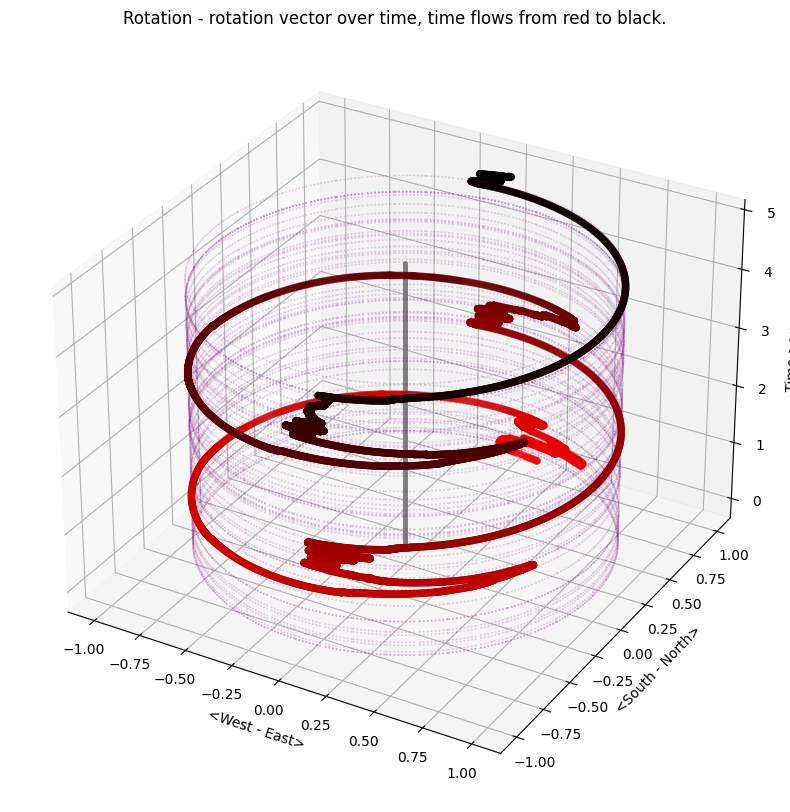

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math
import random

userot["x_around_z"] = userot["eu_zcorr"].apply(math.cos)
userot["y_around_z"] = userot["eu_zcorr"].apply(math.sin)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')
plt.title("Rotation - rotation vector over time, time flows from red to black.")


foo=ax.scatter(userot['x_around_z'],userot['y_around_z'],userot["nanos"], color=userot["timecolor"])

ax.scatter(userot['zeros'],userot['zeros'], userot["nanos"], marker='.', color='gray', alpha=0.1)
circlex=[math.cos(x) for x in range(0,360)]
circley=[math.sin(y) for y in range(0,360)]
circlez=userot["nanos"].sample(50)
for i in circlez:
  ax.scatter(circlex, circley, i, marker='.', s=0.3, color='purple', alpha=0.3)


ax.set_xlabel('<West - East>')
ax.set_ylabel('<South - North>')
ax.set_zlabel('Time >>>')


plt.show()


/usr/local/lib/python3.9/dist-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: title={'center': 'Rotation - path from red to black, assuming constant speed, ignoring actual acceleration'}, xlabel='x_path', ylabel='y_path'>

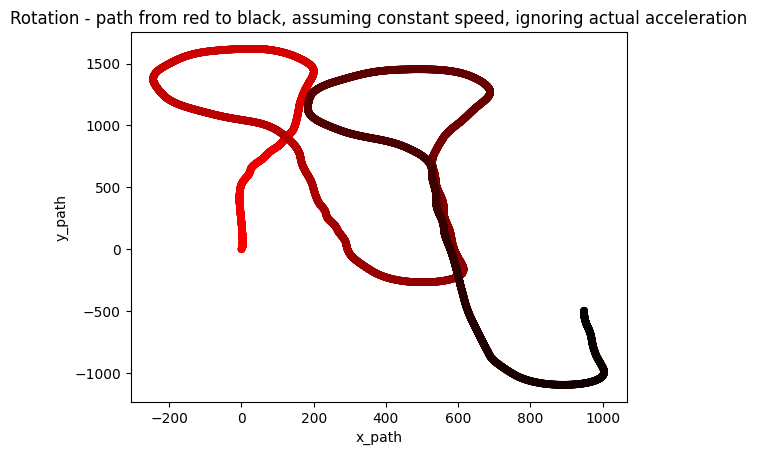

In [ ]:
from statistics import mean

userot["x_path"]=userot["x_around_z"].cumsum()
userot["y_path"]=userot["y_around_z"].cumsum()

userot.plot(kind="scatter", x="x_path",y="y_path",c="timecolor",title="Rotation - path from red to black, assuming constant speed, ignoring actual acceleration")




<Axes: title={'center': 'Acceleration (raw)'}>

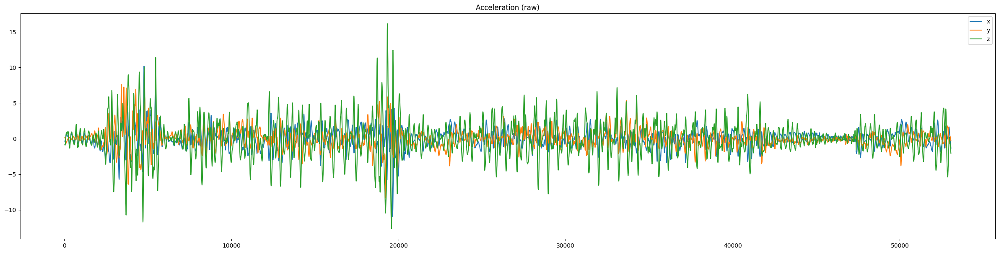

In [ ]:
useacc[["x","y","z"]].plot(figsize=(30,7),title="Acceleration (raw)")

window size
1101


,timestamp,sensortype,x,y,z,zz,quality,zz2,normindex,timecolor,nanos,minutes,zeros,seconds,timedelta,smoothx,smoothy,smoothz
6067,1000974476486817,Earth.Linear_Acceleration,0.055062,0.048203,-1.446034,0.0,0.0,0.0,0.114331,"(0.8856685197399415, 0, 0)",5540918230,0.09,0.0,5.540918,0.004988,0.177553,0.312589,0.023680
6075,1000974481475254,Earth.Linear_Acceleration,-0.018910,0.065631,-1.450428,0.0,0.0,0.0,0.114482,"(0.8855177612362197, 0, 0)",5545906667,0.09,0.0,5.545907,0.004988,0.177843,0.312512,0.023135
6079,1000974486463692,Earth.Linear_Acceleration,-0.067971,0.122069,-1.433775,0.0,0.0,0.0,0.114558,"(0.8854423819843588, 0, 0)",5550895105,0.09,0.0,5.550895,0.004988,0.178101,0.312507,0.022610
6085,1000974491452129,Earth.Linear_Acceleration,-0.147384,0.174198,-1.396172,0.0,0.0,0.0,0.114671,"(0.8853293131065674, 0, 0)",5555883542,0.09,0.0,5.555884,0.004988,0.178307,0.312561,0.022134
6090,1000974496440567,Earth.Linear_Acceleration,-0.184551,0.210619,-1.345057,0.0,0.0,0.0,0.114765,"(0.8852350890417413, 0, 0)",5560871980,0.09,0.0,5.560872,0.004988,0.178498,0.312671,0.021697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53035,1001017081254213,Earth.Linear_Acceleration,-0.741774,0.057822,-1.466737,0.0,0.0,0.0,0.999435,"(0.0005653443889569454, 0, 0)",48145685626,0.80,0.0,48.145686,0.004988,0.157140,-0.186976,-0.024858
53042,1001017086242650,Earth.Linear_Acceleration,-0.875322,-0.066884,-1.682022,0.0,0.0,0.0,0.999567,"(0.0004334306982003433, 0, 0)",48150674063,0.80,0.0,48.150674,0.004988,0.156451,-0.187094,-0.026563
53047,1001017091231088,Earth.Linear_Acceleration,-1.028815,-0.186141,-1.857460,0.0,0.0,0.0,0.999661,"(0.00033920663337416723, 0, 0)",48155662501,0.80,0.0,48.155663,0.004988,0.155538,-0.187482,-0.028532
53054,1001017096219525,Earth.Linear_Acceleration,-1.143885,-0.226895,-1.944682,0.0,0.0,0.0,0.999793,"(0.00020729294261756515, 0, 0)",48160650938,0.80,0.0,48.160651,0.004988,0.154547,-0.187901,-0.030578


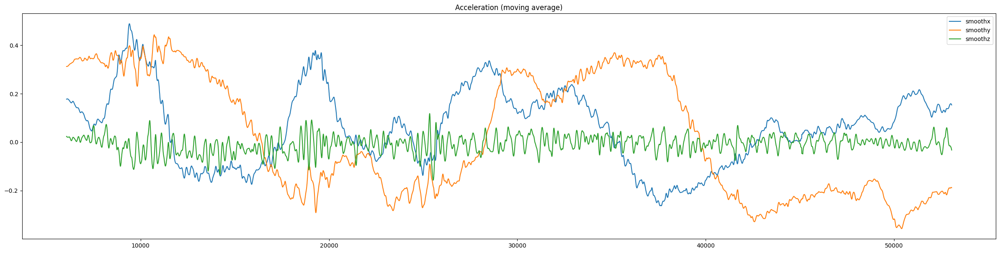

In [ ]:
a=useacc

mx = alldata.timestamp.max()
mi = alldata.timestamp.min()
num = alldata.timestamp.size
points_in_100ms = int(num/((mx-mi)/1000.0/1000.0/100.0))
points_in_10ms = int(num/((mx-mi)/1000.0/1000.0/10.0))
points_in_1ms = int(num/((mx-mi)/1000.0/1000.0))
points_in_1s = int(num/((mx-mi)/1000.0/1000.0/1000.0))
window_size=points_in_100ms
window_size=points_in_1s
#window_size=max(points_in_1ms,2)
print("window size")
print(window_size)


useacc["smoothx"]=a["x"].rolling(window_size).mean()
useacc["smoothy"]=a["y"].rolling(window_size).mean()
useacc["smoothz"]=a["z"].rolling(window_size).mean()

useacc=useacc.dropna()
useacc[["smoothx","smoothy","smoothz"]].plot(figsize=(30,7),title="Acceleration (moving average)")
useacc

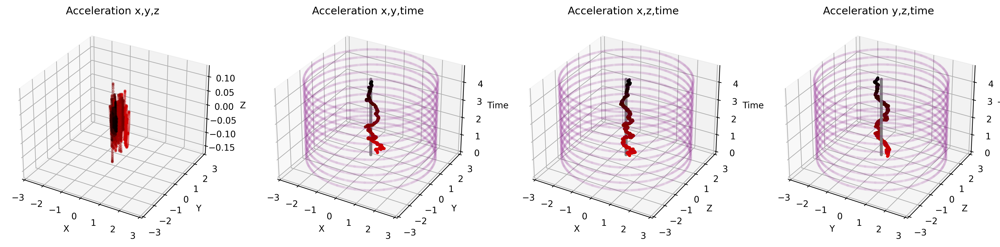

(5540918230, 48165639330, 0, 0, 5.54091823)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math
import random

fig = plt.figure(figsize=(20,40),dpi=300)

xs=useacc["smoothx"].values
ys=useacc["smoothy"].values
zs=useacc["smoothz"].values
colors=useacc["timecolor"].values
ztime=useacc["nanos"].values
pole=[p for p in range(useacc["nanos"].values[0],useacc["nanos"].values[-1],int((useacc["nanos"].values[-1]-useacc["nanos"].values[0])/100))]

zeros=[0]*useacc["smoothx"].size
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]

axs=[]
for i in range(0,4):
  ax = fig.add_subplot(1, 4, i+1, projection='3d')
  ax.set_xlim(-3,3)
  ax.set_ylim(-3,3)
  axs.append(ax)


axs[0].scatter(xs,ys,zs, alpha=0.2, c=colors, marker='.')
axs[1].scatter(xs,ys,ztime, alpha=0.3, c=colors, marker='.')
axs[2].scatter(xs,zs,ztime, alpha=0.3, c=colors, marker='.')
axs[3].scatter(ys,zs,ztime, alpha=0.3, c=colors, marker='.')

for i in range(1,4):
  axs[i].scatter(zeros, zeros, ztime, marker='.', color='gray', alpha=0.1)
  num_circles=10
  for z in range(0,int(len(ztime)-1),int(len(ztime)/num_circles)):
    axs[i].scatter(circlex, circley, ztime[z], marker='.', color='purple', alpha=0.05)
axs[1].scatter(zeros[1], zeros[1], pole[1], marker='.', color='red', alpha=1, s=5)



axs[1].set_zlim(0.5,max(ztime))
axs[2].set_zlim(0.5,max(ztime))
axs[3].set_zlim(0.5,max(ztime))


axs[0].set_title("Acceleration x,y,z")
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].set_zlabel('Z')
axs[1].set_title("Acceleration x,y,time")
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].set_zlabel('Time')
axs[2].set_title("Acceleration x,z,time")
axs[2].set_xlabel('X')
axs[2].set_ylabel('Z')
axs[2].set_zlabel('Time')
axs[3].set_title("Acceleration y,z,time")
axs[3].set_xlabel('Y')
axs[3].set_ylabel('Z')
axs[3].set_zlabel('Time')

plt.show()
# Note that time doesn't actually start from zero because it takes like 5 secondse before both sensors are available.
# Also we might arbitrarily skip "garbage" from the beginning, like walking to the car or warmup lap
pole[0], pole[-1], zeros[0], zeros[-1],pole[0]/1000.0/1000.0/1000.0

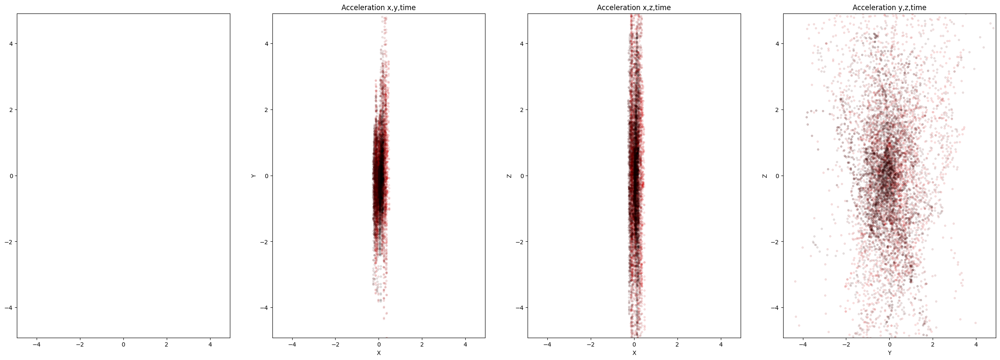

In [ ]:
qxs=useacc["x"].values
ys=useacc["y"].values
zs=useacc["z"].values
colors=useacc["timecolor"].values
ztime=useacc["nanos"].values
pole=ztime
zeros=[0]*len(xs)
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]

spanx=useacc["x"].abs().quantile(0.95)
spany=useacc["y"].abs().quantile(0.95)
spanz=useacc["z"].abs().quantile(0.95)
span=max(spanx,spany,spanz)

import matplotlib.pyplot as plt
import numpy as np
import math
import random

fig = plt.figure(figsize=(30,10))

axs=[]
for i in range(0,4):
  ax = fig.add_subplot(1, 4, i+1)
  ax.set_xlim(-span,span)
  ax.set_ylim(-span,span)
  axs.append(ax)

axs[1].scatter(xs,ys, alpha=0.1, color=colors, marker='.')
axs[2].scatter(xs,zs, alpha=0.1, color=colors, marker='.')
axs[3].scatter(ys,zs, alpha=0.1, color=colors, marker='.')

axs[1].set_title("Acceleration x,y,time")
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[2].set_title("Acceleration x,z,time")
axs[2].set_xlabel('X')
axs[2].set_ylabel('Z')
axs[3].set_title("Acceleration y,z,time")
axs[3].set_xlabel('Y')
axs[3].set_ylabel('Z')

plt.show()

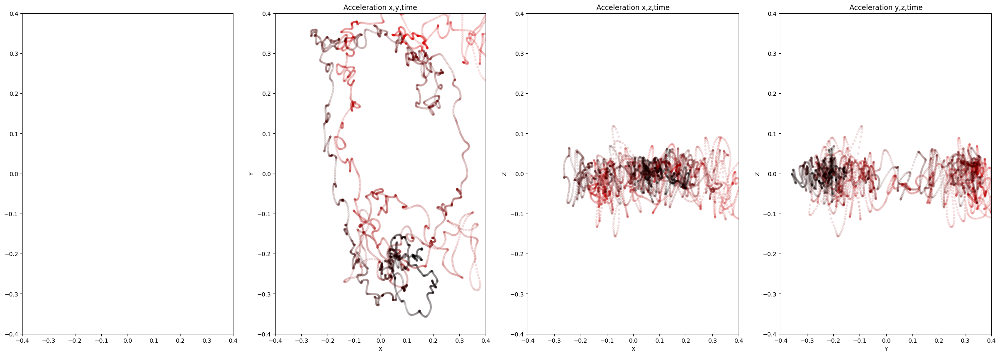

In [ ]:
xs=useacc["smoothx"].values
ys=useacc["smoothy"].values
zs=useacc["smoothz"].values
colors=useacc["timecolor"].values
ztime=useacc["nanos"].values
pole=ztime
zeros=[0]*len(xs)
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]

spanx=useacc["smoothx"].abs().quantile(0.99)
spany=useacc["smoothy"].abs().quantile(0.99)
spanz=useacc["smoothz"].abs().quantile(0.99)
span=max(spanx,spany,spanz)

import matplotlib.pyplot as plt
import numpy as np
import math
import random

fig = plt.figure(figsize=(30,10))

axs=[]
for i in range(0,4):
  ax = fig.add_subplot(1, 4, i+1)
  ax.set_xlim(-span,span)
  ax.set_ylim(-span,span)
  axs.append(ax)

axs[1].scatter(xs,ys, alpha=0.1, color=colors, marker='.')
axs[2].scatter(xs,zs, alpha=0.1, color=colors, marker='.')
axs[3].scatter(ys,zs, alpha=0.1, color=colors, marker='.')

axs[1].set_title("Acceleration x,y,time")
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[2].set_title("Acceleration x,z,time")
axs[2].set_xlabel('X')
axs[2].set_ylabel('Z')
axs[3].set_title("Acceleration y,z,time")
axs[3].set_xlabel('Y')
axs[3].set_ylabel('Z')

plt.show()

In [ ]:
import math
def rotate_x(yzangle,x,y,z):
  xaxis=[x,
         y*math.cos(yzangle) - z * math.sin(yzangle),
         y*math.sin(yzangle) + z * math.cos(yzangle)]
  return xaxis

def rotate_y(xzangle,x,y,z):
  yaxis=[x * math.cos(xzangle) + z * math.sin(xzangle),
         y,
         -x * math.sin(xzangle) + z * math.cos(xzangle)]
  return yaxis

def rotate_xy(yzangle,xzangle,x,y,z):
  x,y,z = rotate_x(yzangle,x,y,z)
  x,y,z = rotate_y(xzangle,x,y,z)
  return x,y,z

def rotate_z(xyangle,x,y,z):
  zaxis=[x * math.cos(xyangle) - y * math.sin(xyangle),
         x * math.cos(xyangle) + y * math.cos(xyangle),
         z]
  return zaxis;

<ipython-input-30-a8cc89bbf316>:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["vx"]=vxs
<ipython-input-30-a8cc89bbf316>:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["vy"]=vys
<ipython-input-30-a8cc89bbf316>:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-vers

              timestamp                 sensortype         x         y         z   zz  quality  zz2  normindex                       timecolor  ...  timedelta   smoothx   smoothy   smoothz  \
6067   1000974476486817  Earth.Linear_Acceleration  0.055062  0.048203 -1.446034  0.0      0.0  0.0   0.114331      (0.8856685197399415, 0, 0)  ...   0.004988  0.177553  0.312589  0.023680   
6075   1000974481475254  Earth.Linear_Acceleration -0.018910  0.065631 -1.450428  0.0      0.0  0.0   0.114482      (0.8855177612362197, 0, 0)  ...   0.004988  0.177843  0.312512  0.023135   
6079   1000974486463692  Earth.Linear_Acceleration -0.067971  0.122069 -1.433775  0.0      0.0  0.0   0.114558      (0.8854423819843588, 0, 0)  ...   0.004988  0.178101  0.312507  0.022610   
6085   1000974491452129  Earth.Linear_Acceleration -0.147384  0.174198 -1.396172  0.0      0.0  0.0   0.114671      (0.8853293131065674, 0, 0)  ...   0.004988  0.178307  0.312561  0.022134   
6090   1000974496440567  Earth.Linear_Ac

<ipython-input-30-a8cc89bbf316>:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["vx"]=vxs
<ipython-input-30-a8cc89bbf316>:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  useacc["vy"]=vys
<ipython-input-30-a8cc89bbf316>:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

              timestamp                 sensortype         x         y         z   zz  quality  zz2  normindex                       timecolor  ...  timedelta   smoothx   smoothy   smoothz  \
6067   1000974476486817  Earth.Linear_Acceleration  0.055062  0.048203 -1.446034  0.0      0.0  0.0   0.114331      (0.8856685197399415, 0, 0)  ...   0.004988  0.177553  0.312589  0.023680   
6075   1000974481475254  Earth.Linear_Acceleration -0.018910  0.065631 -1.450428  0.0      0.0  0.0   0.114482      (0.8855177612362197, 0, 0)  ...   0.004988  0.177843  0.312512  0.023135   
6079   1000974486463692  Earth.Linear_Acceleration -0.067971  0.122069 -1.433775  0.0      0.0  0.0   0.114558      (0.8854423819843588, 0, 0)  ...   0.004988  0.178101  0.312507  0.022610   
6085   1000974491452129  Earth.Linear_Acceleration -0.147384  0.174198 -1.396172  0.0      0.0  0.0   0.114671      (0.8853293131065674, 0, 0)  ...   0.004988  0.178307  0.312561  0.022134   
6090   1000974496440567  Earth.Linear_Ac

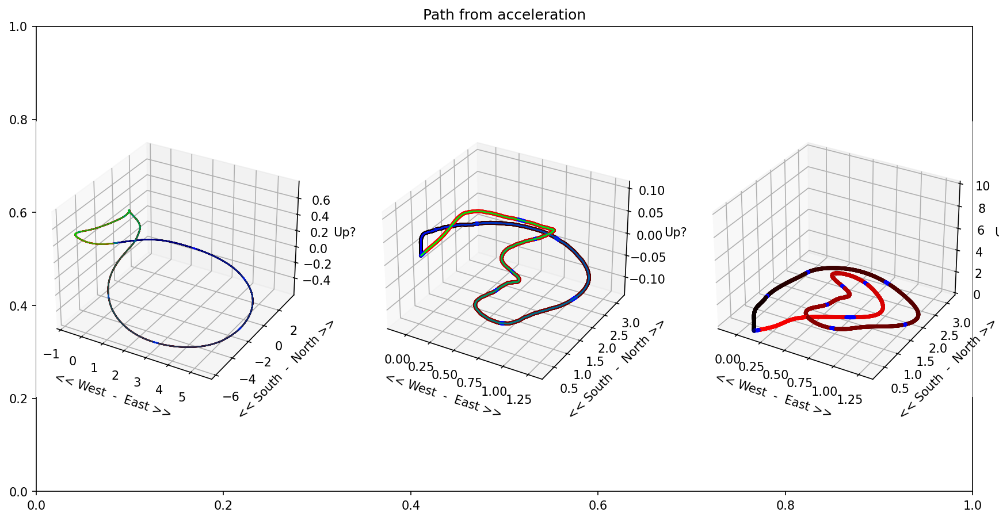

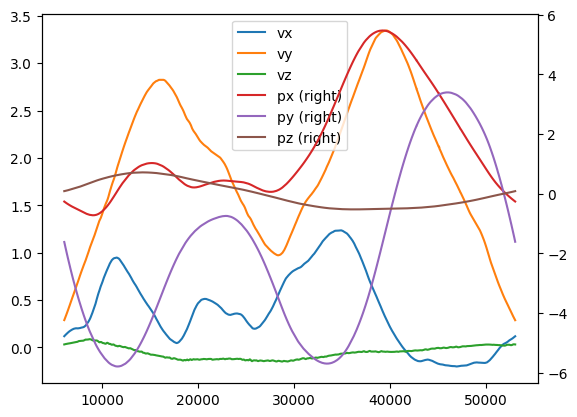

In [ ]:
N2S=1.0/1000.0/1000.0/1000.0
#N2S=1
reset_every=100000000
vdecay=0.99
pdecay=1.0
pd.options.display.width = 200


import time
import scipy

fig = plt.figure(figsize=(14,7),dpi=150)
plt.title("Path from acceleration")

ts=useacc["nanos"].values
xs=useacc["smoothx"].values
ys=useacc["smoothy"].values
zs=useacc["smoothz"].values

ztime=useacc.query("abs(smoothx) >=0")["nanos"].values
pole=ztime

zeros=[0]*useacc["smoothx"].size
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]







#VELOCITY
def acc2vel(xs,ys,zs):
  xmean=mean(xs)
  ymean=mean(ys)
  zmean=mean(zs)
  vxs=[x-xmean for x in xs]
  vys=[y-ymean for y in ys]
  vzs=[z-zmean for z in zs]
  for i in range(1,len(zs)):
    vxs[i-1]
    vxs[i]
    ts[i-1]
    ts[i]
    vxs[i]=vdecay*vxs[i-1]+vxs[i]*(ts[i]-ts[i-1])*N2S
    vys[i]=vdecay*vys[i-1]+vys[i]*(ts[i]-ts[i-1])*N2S
    vzs[i]=vdecay*vzs[i-1]+vzs[i]*(ts[i]-ts[i-1])*N2S

  return vxs,vys,vzs



#POSITION
def vel2pos(vxs,vys,vzs):
  xmean=mean(vxs)
  ymean=mean(vys)
  zmean=mean(vzs)
  xxs=[x-xmean for x in vxs]
  yys=[y-ymean for y in vys]
  zzs=[z-zmean for z in vzs]

  for i in range(1,len(xxs)):
    xxs[i]=pdecay*xxs[i-1]+xxs[i]*(ts[i]-ts[i-1])*N2S

  for i in range(1,len(xxs)):
    yys[i]=pdecay*yys[i-1]+yys[i]*(ts[i]-ts[i-1])*N2S

  for i in range(1,len(xxs)):
    zzs[i]=pdecay*zzs[i-1]+zzs[i]*(ts[i]-ts[i-1])*N2S

  return xxs,yys,zzs

vdecay=1
vxs,vys,vzs = acc2vel(xs,ys,zs)
xxs,yys,zzs = vel2pos(vxs,vys,vzs)

useacc["vx"]=vxs
useacc["vy"]=vys
useacc["vz"]=vzs
useacc["px"]=xxs
useacc["py"]=yys
useacc["pz"]=zzs

print(useacc)
print(xxs[:20])
useacc[["vx","vy","vz","px","py","pz"]].plot(secondary_y=["px","py","pz"])



zeros=[0.0]*len(xxs)
colors=['yellow']*len(xxs)
for i in range(0,len(colors)):
  colors[i]=((len(colors)-i)/len(colors),0,0)
  if i%reset_every==0:
    colors[i]='yellow'

ax = fig.add_subplot(1,3,1,projection='3d')

step=int(len(colors)/10)
print(len(colors),step)
for n in range(0,len(colors)-step-1, step):
  for m in range(0,50):
    k=n+m
    colors[k]=(0,0,1)
colors2=[0]*len(colors)
for i in range(0,len(colors)):
  colors2[i]=(0,(len(colors)-i)/len(colors),i/len(colors))

ax.scatter(xxs, yys, zzs, marker='.', color=colors, alpha=0.8,s=0.2)
ax.scatter(useacc["px"].values, useacc["py"].values, useacc["pz"].values, marker='*',s=0.1, color=colors2[-useacc["px"].size:], alpha=0.05)


ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')
ax.set_zlabel('Up?')

vdecay=0.995
pdecay=1.0
vxs,vys,vzs = acc2vel(xs,ys,zs)
xxs,yys,zzs = vel2pos(vxs,vys,vzs)

useacc["vx"]=vxs
useacc["vy"]=vys
useacc["vz"]=vzs
useacc["px"]=xxs
useacc["py"]=yys
useacc["pz"]=zzs
print(useacc)
print(xxs[:20])

ax2 = fig.add_subplot(1,3,2,projection='3d')
ax2.scatter(xxs, yys, zzs, marker='.', color=colors, alpha=0.5)
ax2.scatter(useacc["px"], useacc["py"], useacc["pz"], marker='.', color=colors2[-useacc["px"].size:], alpha=0.5, s=0.2)

#ax2.scatter(xxs, yys, [min(zzs)]*len(zzs), marker='.', color=(0.7,0.7,0.8), alpha=0.005)
#ax2.scatter(xxs, [max(yys)]*len(yys), zzs, marker='.', color=(0.7,0.8,0.7), alpha=0.005)
#ax2.scatter([min(xxs)]*len(xxs), yys, zzs, marker='.', color=(0.7,0.8,0.8), alpha=0.005)

ax2.set_xlabel('<< West  -  East >>')
ax2.set_ylabel('<< South  -  North >>')
ax2.set_zlabel('Up?')

ax = fig.add_subplot(1,3,3,projection='3d')
ax.scatter(xxs, yys, zeros, marker='.', color=colors, alpha=0.5)

ax.set_zlim(0,10)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')
ax.set_zlabel('Up?')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))

plt.show()

(1.287143960607256, 0.48349448671319056, -0.10156370691505327)
(3.1386488024260504, 1.9017093496612227, 0.27484322748556134)
(0.0989357551894807, -0.03501362369591424, -0.12586685258881877)


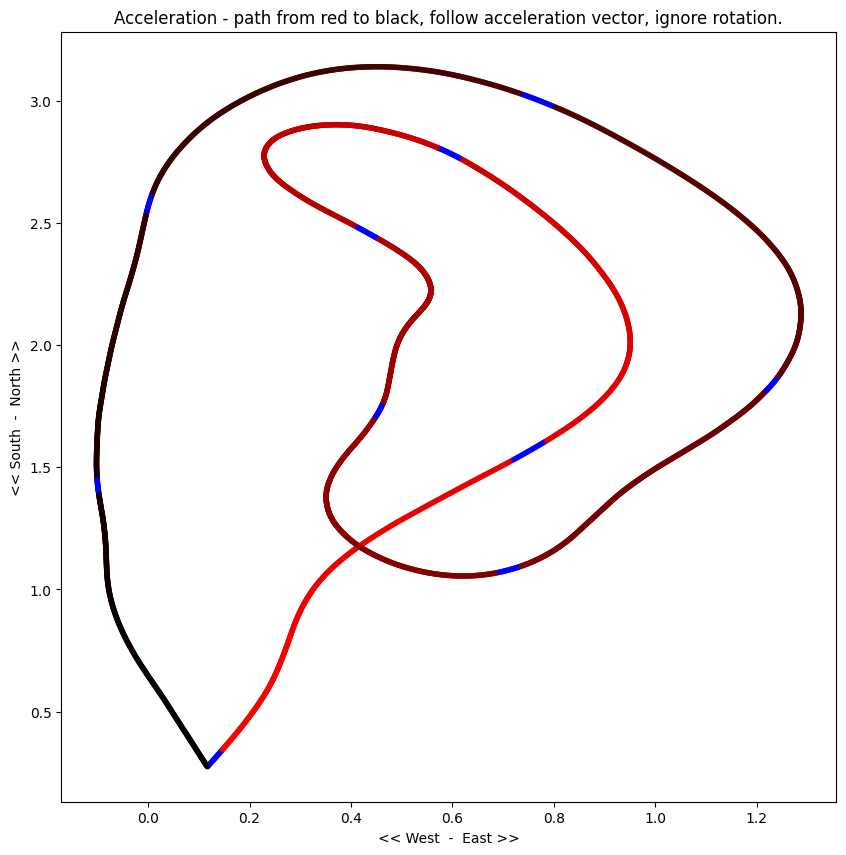

In [ ]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
#ax.set_zlim(0,200)
#
ax.scatter(xxs, yys, marker='.', color=colors, alpha=0.5)

ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Acceleration - path from red to black, follow acceleration vector, ignore rotation.")

plt.show()

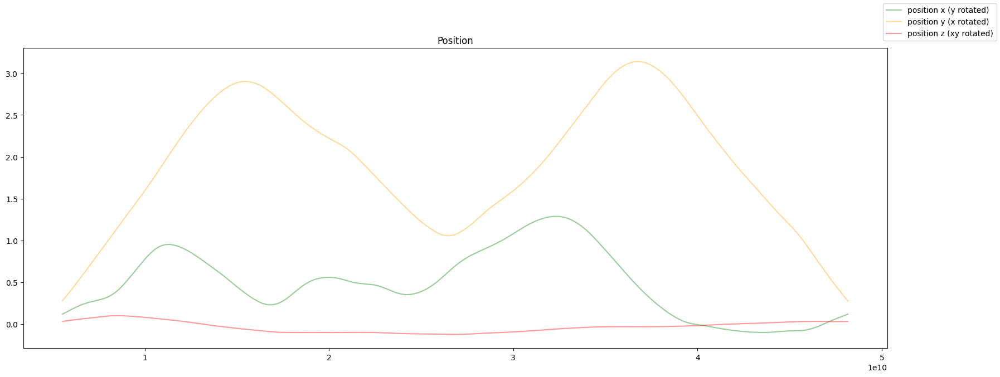

(-0.10156370691505327, 0.27484322748556134, -0.12586685258881877)

In [ ]:
#useacc[["minutes",""]].plot()
fig = plt.figure(figsize=(20,7))
ax = fig.add_subplot()


o=ax.plot(ts,xxs, label="position x (y rotated)", alpha=0.4, color='green')
o=ax.plot(ts,yys, label="position y (x rotated)", alpha=0.4, color='orange')
o=ax.plot(ts,zzs, label="position z (xy rotated)", alpha=0.4, color='red')
ax.set_title("Position")
o=fig.legend()
plt.show()
min(xxs),min(yys),min(zzs)

(-3.1364655603006706, -179.70623919336344, 3.1328449402028578, 179.4987929425385)
(-0.2628400957855404, -0.3573659037372116, 0.3784008461852861, 0.3719741303726612, -0.10812285607481542, 0.06992211652648773)
(-0.9999868564859944, -0.9999999775703733, 0.9999999349289439, 0.99999995705938, -0.4999992317775289, 0.49999999994155636)


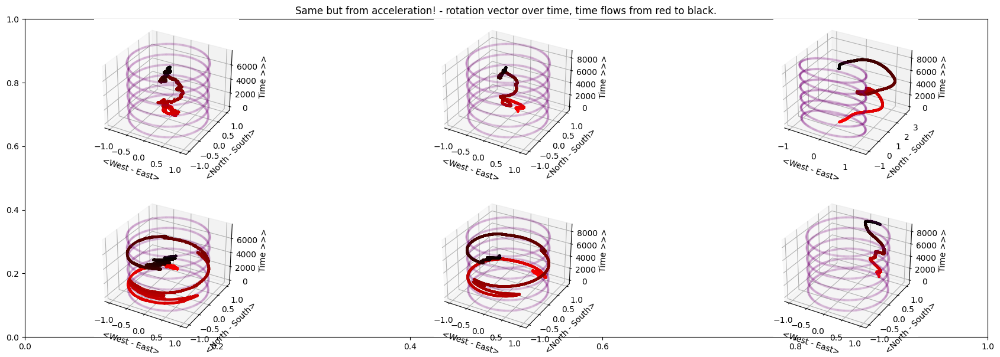

In [ ]:
#useaxis=rotz
xs=useacc["smoothx"].values
ys=useacc["smoothy"].values
zs=useacc["smoothz"].values
colors=useacc["timecolor"].values
ztime=useacc["nanos"].values
pole=ztime
ts=ztime
zeros=[0]*len(xs)
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]


ts=ts[window_size:-1]
xs=xs[window_size:-1]
ys=ys[window_size:-1]
zs=zs[window_size:-1]




import matplotlib.pyplot as plt
import numpy as np
import math
import random
def acc2rot_z(xs,ys,zs):
  acc_xyangles=[]
  for i in range(1,len(xs)):
    angle=math.atan2(ys[i],xs[i])
    acc_xyangles.append(angle)
  return acc_xyangles




fig = plt.figure(figsize=(21,7),dpi=100)
plt.title("Same but from acceleration! - rotation vector over time, time flows from red to black.")

useaxis=acc2rot_z(xs,ys,zs)
print((min(useaxis),np.rad2deg(min(useaxis)),max(useaxis),np.rad2deg(max(useaxis))))


def rot2vec(useaxis):
  xs=[math.cos(a) for a in useaxis]
  ys=[math.sin(a) for a in useaxis]
  return xs,ys

def helpers(xs):
  colors=['white']*len(xs)
  for i in range(0,len(colors)):
    colors[i]=((len(colors)-i)/len(colors),0,0)
  zeros=[0]*len(xs)
  consttime=range(0,len(xs))
  return colors, zeros, consttime

def drawit(ax, xs,ys,colors, zeros, consttime):
  ax.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)
  #ax.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
  circlex=[math.cos(x) for x in range(0,360)]
  circley=[math.sin(y) for y in range(0,360)]
  for i in range(0,len(colors),int(max(consttime)/5)):
    ax.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)

  ax.set_xlabel('<West - East>')
  ax.set_ylabel('<North - South>')
  ax.set_zlabel('Time >>>')

colors, zeros, consttime = helpers(xs)
print((min(xs),min(ys),max(xs),max(ys),min([x*y for x,y in zip(xs,ys)]),max([x*y for x,y in zip(xs,ys)])))
ax = fig.add_subplot(2,3,1,projection='3d')
drawit(ax, xs,ys,colors, zeros, consttime)

colors, zeros, consttime = helpers(vxs)
#print((min(xs),min(ys),max(xs),max(ys),min([x*y for x,y in zip(xs,ys)]),max([x*y for x,y in zip(xs,ys)])))
ax = fig.add_subplot(2,3,2,projection='3d')
drawit(ax, vxs,vys,colors, zeros, consttime)

colors, zeros, consttime = helpers(xxs)
#print((min(xs),min(ys),max(xs),max(ys),min([x*y for x,y in zip(xs,ys)]),max([x*y for x,y in zip(xs,ys)])))
ax = fig.add_subplot(2,3,3,projection='3d')
drawit(ax, xxs,yys,colors, zeros, consttime)



xs,ys = rot2vec(useaxis)
colors, zeros, consttime = helpers(xs)
print((min(xs),min(ys),max(xs),max(ys),min([x*y for x,y in zip(xs,ys)]),max([x*y for x,y in zip(xs,ys)])))
ax = fig.add_subplot(2,3,4,projection='3d')
drawit(ax, xs,ys,colors, zeros, consttime)


useaxis=acc2rot_z(vxs,vys,vzs)
xs,ys = rot2vec(useaxis)
colors, zeros, consttime = helpers(xs)
ax = fig.add_subplot(2,3,5,projection='3d')
drawit(ax, xs,ys,colors, zeros, consttime)

useaxis=acc2rot_z(xxs,yys,zzs)
xs,ys = rot2vec(useaxis)
ax = fig.add_subplot(2,3,6,projection='3d')
drawit(ax, xs,ys,colors, zeros, consttime)
#

plt.show()

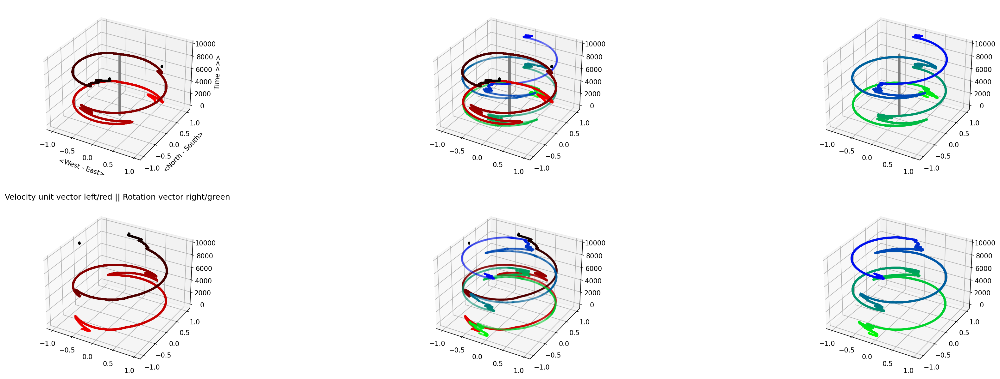

In [ ]:

def acc2rot_z(xs,ys,zs):
  acc_xyangles=[]
  for i in range(1,len(xs)):
    angle=math.atan2(ys[i],xs[i])
    acc_xyangles.append(angle)
  return acc_xyangles




import matplotlib.pyplot as plt
import numpy as np
import math
import random



fig = plt.figure(figsize=(30,10),dpi=150)
ax = fig.add_subplot(2,3,1,projection='3d')
ax4 = fig.add_subplot(2,3,4,projection='3d')

plt.title("Velocity unit vector left/red || Rotation vector right/green")

#Make them equal length...
ratio = len(vxs)/len(rotz)
period = int(math.ceil(1/(1-ratio)))
lvxs = [0.0]*(len(rotz))
lvys = [0.0]*(len(rotz))
lvzs = [0.0]*(len(rotz))
shift=0
for i in range(0, len(vxs)-period):
  if i+shift+1>len(lvxs):
    print("i={}, shift={}, period={}, len(lvxs)={}",i,shift,period, len(lvxs))
    break
  lvxs[i+shift]=vxs[i]
  lvys[i+shift]=vys[i]
  lvzs[i+shift]=vzs[i]
  if i % period == 0 and i>0:
    shift += 1
    lvxs[i+shift]=lvxs[i+shift-1]
    lvys[i+shift]=lvys[i+shift-1]
    lvzs[i+shift]=lvzs[i+shift-1]



accangles=acc2rot_z(lvxs,lvys,lvzs)
xs=[math.cos(a) for a in accangles]
ys=[math.sin(a) for a in accangles]
zs=[len(xs)-i for i in range(0,len(xs))]

colors=['white']*len(xs)
for i in range(0,len(colors)):
  colors[i]=((len(colors)-i)/len(colors),0,0)
zeros=[0]*len(xs)
consttime=range(0,len(xs))

ax.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)
ax4.scatter([-x for x in xs], [-x for x in ys], consttime, marker='.', color=colors, alpha=0.8)

ax.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
circlex=[math.cos(x) for x in range(0,360)]
circley=[math.sin(y) for y in range(0,360)]
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)


ax.set_xlabel('<West - East>')
ax.set_ylabel('<North - South>')
ax.set_zlabel('Time >>>')


ax2 = fig.add_subplot(2,3,2,projection='3d')
ax3 = fig.add_subplot(2,3,3,projection='3d')
ax5 = fig.add_subplot(2,3,5,projection='3d')
ax6 = fig.add_subplot(2,3,6,projection='3d')

ax2.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)
ax2.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax2.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)
ax5.scatter([-x for x in xs], [-x for x in ys], consttime, marker='.', color=colors, alpha=0.1)



useaxis=rotzcorr
xs=[math.cos(a) for a in useaxis]
ys=[math.sin(a) for a in useaxis]
zs=[len(xs)-i for i in range(0,len(xs))]
colors=['white']*len(xs)
for i in range(0,len(colors)):
  colors[i]=(0,(len(colors)-i)/len(colors),i/len(colors))
zeros=[0]*len(xs)
consttime=range(0,len(xs))

ax2.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.1)
ax5.scatter([-x for x in xs], [-x for x in ys], consttime, marker='.', color=colors, alpha=0.1)


ax3.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)
ax6.scatter([-x for x in xs], [-x for x in ys], consttime, marker='.', color=colors, alpha=0.8)

ax3.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax3.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)


plt.show()

[1.471266303185119, 1.4586533890703293, 1.4459347535593654, 1.4436246615797843, 1.431382306949894, 1.4220672498816391, 1.41374743285631, 1.4060814061021711, 1.400543020162302, 1.3981618968739842, 1.3965785228442644, 1.3986757655187643, 1.4012061708870602, 1.407687163464656, 1.413906965740308, 1.4249495005444748, 1.4333401210347478, 1.4445999753709626, 1.4540695050210772, 1.463889246750297, 1.4737420745024898, 1.4854934467201442, 1.4942745354953195, 1.5010178523440911, 1.507773726478972, 1.5182165417293354, 1.5238613056355967, 1.5284645371049204, 1.5332756090654818, 1.5398945336043315, 1.5451778076091096, 1.5517649328057188, 1.5564851885390418, 1.5614169097509722, 1.565671170026671, 1.5724087822894597, 1.5763132852847608, 1.580866889210073, 1.5842628456307055, 1.5867802086077556, 1.5888305972661334, 1.5908859774137254, 1.5916103264167922, 1.5930783600596181, 1.5923736942409883, 1.5934320218513889, 1.591304115949602, 1.5891478725827946, 1.5856549267693232, 1.5831206964047766, 1.578647585

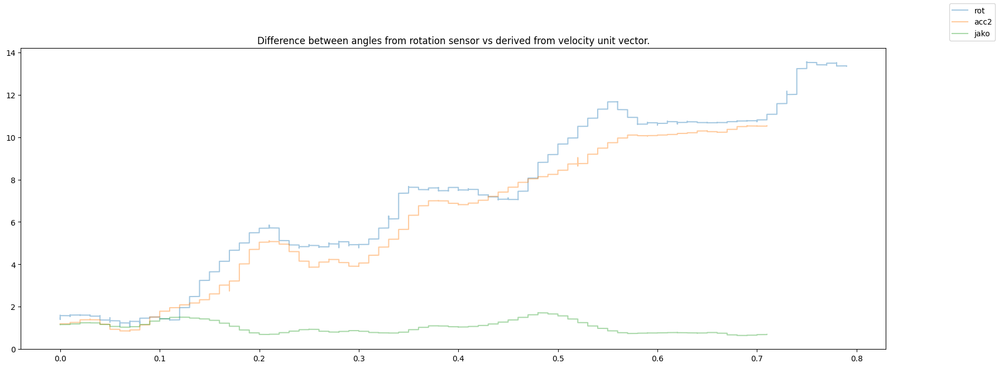

[16.60615221604914, 15.883977317233843, 15.155898752131861, 15.024306035277078, 14.323720954864314, 13.790884495541547, 13.315024565332635, 12.876557455290794, 12.559900442179185, 12.424029097767317, 12.333691761857324, 12.454010408013232, 12.59885219387695, 12.969706329198573, 13.325216545701494, 13.956632066323863, 14.435683099244528, 15.078698329603156, 15.61866163078571, 16.178150186398085]


(-49.233473327124784, 74.05999648521527)

In [ ]:
useaxis=rotzcorr

#useaxis=[z for z in useaxis]
useaxis2=[]
top=0
boundary = math.pi/4
zprev=useaxis[0]
counter=0
for z in useaxis:
  counter+=1
  if counter % 50 == 0:
    continue

  z=(z)%(2*math.pi)
  if z - zprev < -boundary+0.01:
    top += math.pi
  elif z - zprev > boundary-0.01:
    top -= math.pi
  if z - zprev < -boundary+0.01:
    top += math.pi*7/8
  elif z - zprev > boundary-0.01:
    top -= math.pi*7/8

  zprev=z

  useaxis2.append(z + top)

#useaxis=useaxis2

diffangles=[]

accangles=acc2rot_z(vxs,vys,vzs)
prod=[(y+1)/(x+1) for x,y in zip(vxs,vys)]
print(useaxis[0:100])
print(accangles[0:100])
print(min(accangles))

for r,a in zip(np.rad2deg(useaxis[0:len(accangles)]), np.rad2deg(accangles)):



  d=(r - a + 180) % (2*180) - 180
  diffangles.append(d)
"""
  d  = r-a
  if d >180:
    d = 360 - d
  elif d < -180:
    d = -360-d
"""

accangles2=[]
top=0
boundary = math.pi/4
aprev=accangles[0]
for a in accangles:
 if a - aprev < -boundary+0.01:
    top += math.pi
 elif a - aprev > boundary-0.01:
    top -= math.pi
 if a - aprev < -boundary+0.01:
    top += math.pi*7/8
 elif a - aprev > boundary-0.01:
    top -= math.pi*7/8
 aprev=a

 accangles2.append((a + top))




#accangles=[a+math.pi if a<0 else a for a in accangles]
#accangles=accangles2
print(accangles[0:100])

fig = plt.figure(figsize=(20,7))
ax = fig.add_subplot()
#o=ax.plot(minutes[0:len(diffangles)],diffangles, label="diff between angles (deg)", alpha=0.4)
#o=ax.plot(minutes[0:len(accangles)],accangles, label="acc", alpha=0.4)
#o=ax.plot(minutes[0:len(useaxis)],useaxis, label="rot", alpha=0.4)
o=ax.plot(userot["minutes"].values[:len(useaxis2)],useaxis2, label="rot", alpha=0.4)
o=ax.plot(userot["minutes"].values[:len(accangles2)],accangles2, label="acc2", alpha=0.4)
o=ax.plot(userot["minutes"].values[0:len(prod)],prod, label="jako", alpha=0.4)
ax.set_title("Difference between angles from rotation sensor vs derived from velocity unit vector.")
o=fig.legend()
plt.show()




print(diffangles[0:20])
min(diffangles),max(diffangles)

[1.471266303185119, 1.4586533890703293, 1.4459347535593654, 1.4436246615797843, 1.431382306949894, 1.4220672498816391, 1.41374743285631, 1.4060814061021711, 1.400543020162302, 1.3981618968739842, 1.3965785228442644, 1.3986757655187643, 1.4012061708870602, 1.407687163464656, 1.413906965740308, 1.4249495005444748, 1.4333401210347478, 1.4445999753709626, 1.4540695050210772, 1.463889246750297, 1.4737420745024898, 1.4854934467201442, 1.4942745354953195, 1.5010178523440911, 1.507773726478972, 1.5182165417293354, 1.5238613056355967, 1.5284645371049204, 1.5332756090654818, 1.5398945336043315, 1.5451778076091096, 1.5517649328057188, 1.5564851885390418, 1.5614169097509722, 1.565671170026671, 1.5724087822894597, 1.5763132852847608, 1.580866889210073, 1.5842628456307055, 1.5867802086077556, 1.5888305972661334, 1.5908859774137254, 1.5916103264167922, 1.5930783600596181, 1.5923736942409883, 1.5934320218513889, 1.591304115949602, 1.5891478725827946, 1.5856549267693232, 1.5831206964047766, 1.578647585

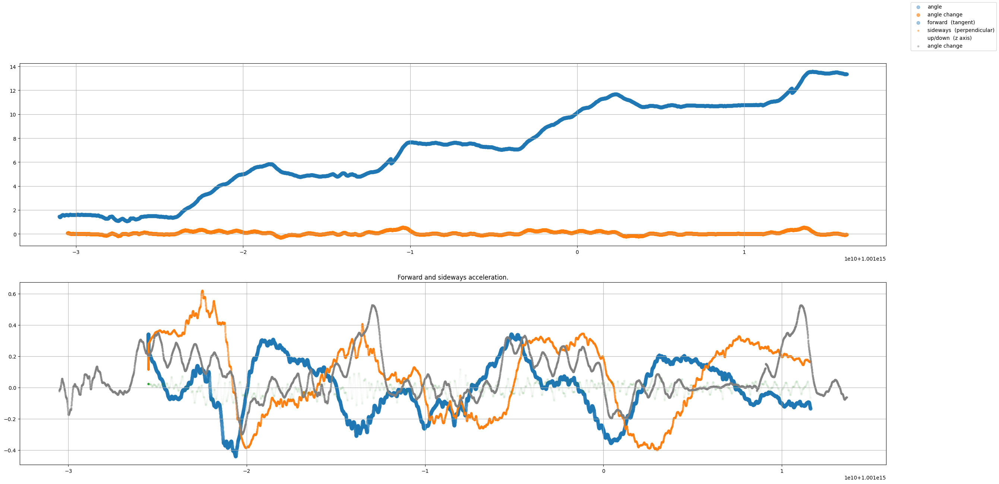

In [ ]:
math.pi

afwd=[]
aside=[]
azs=[]
ats=[]

ts = [row[0] for row in rot]


#accel = list(useacc[["nanos","seconds","minutes","smoothx","smoothy","smoothz"]].to_numpy())
#print(accel)


accel = list(zip(useacc["timestamp"].values,useacc["smoothx"].values,useacc["smoothy"].values,useacc["smoothz"].values))
a = accel.pop(0)
new_ats = a[0]
for direction,t in zip(accangles,ts):
  # scan accelerations until matching ts
  if len(accel)==0:
    break
  while(new_ats<t):
    a = accel.pop(0)
    new_ats = a[0]
  ats.append(new_ats)
  ax = a[1]
  ay = a[2]
  az = a[3]
  direction -=math.pi/2
  afwd.append( ax*math.cos(direction)-ay*math.sin(direction) )
  aside.append( ax*math.sin(direction)+ay*math.cos(direction) )
  azs.append(az)

print(rotzcorr)
print(len(ats),len(afwd))
print(afwd[0:15])
print(ats[0:15])
print(ts[0:15])
print(ts[-1])

atsminutes=[(t-ats[0])/1000.0/1000.0/1000.0/60.0 for t in ats]


rts = userot["timestamp"].values


#useaxis3=[z if abs(z) < 2*math.pi else z -(z/abs(z))* math.pi*4 for z in useaxis2]
useaxis3=useaxis2
fig = plt.figure(figsize=(30,14))
ax = fig.add_subplot(2,1,1)
o=ax.scatter(rts[0:len(useaxis3)] ,useaxis3, label="angle", alpha=0.4)


anglederiv=[x2-x1 for x1,x2 in zip(useaxis3[:-1],useaxis3[1:])]
sidesum=[x for x in aside]
print(min(sidesum),max(sidesum))
for i in range(2,len(aside)):
  sidesum[i]=sidesum[i-1]+sidesum[i]*(ats[i]-ats[i-1])*N2S
sidesum=[s if abs(s) < 10 else 0 for s in sidesum]

anglederiv=[x*50 if abs( x)<math.pi/32 else 0 for x in anglederiv]
foo = pd.DataFrame({'a':anglederiv})

anglederiv=foo.a.rolling(100,center=False).mean()



ax.scatter(rts[100:len(anglederiv)], anglederiv[100:], label="angle change", alpha=0.6)
ax.grid()
ax = fig.add_subplot(2,1,2)

print(len(ats[100:len(afwd)+100]),len(afwd))
o=ax.scatter(ats[100:len(afwd)+100],afwd[100:], label="forward  (tangent)", alpha=0.4)
o=ax.scatter(ats[100:len(afwd)+100],aside[100:], marker='.', label="sideways  (perpendicular)", alpha=0.4)
o=ax.scatter(ats[100:len(afwd)+100],azs[100:], marker='.', label="up/down  (z axis)", alpha=0.01)
ax.scatter(rts[100:len(anglederiv)-500], anglederiv[600:], marker='.', label="angle change", alpha=0.4, color='gray')
#ax.scatter(ats[100:len(sidesum)], sidesum[:-100], marker='.', label="angle change", alpha=0.4, color='cyan')
ax.grid()
print(mean(afwd))
print(mean(aside))

ax.set_title("Forward and sideways acceleration.")
o=fig.legend()
plt.show()


In [ ]:
fig = plt.figure(figsize=(21,5),dpi=200)
ax = fig.add_subplot(projection='3d')

afwd[0]=0
aside[0]=0
afwd[-1]=0
aside[-1]=0



fbase=max(max(afwd),abs(min(afwd)),1)
print(max(afwd),abs(min(afwd)),1)
print(fbase)
colors=[(a/fbase*0.3+0.7,0,0) if a>0 else (0,0,-a/fbase*0.3/2+0.7) for a in afwd]
zeros=[0.0]*len(ats)
o=ax.scatter(ats,zeros,[-x for x in afwd], label="forward  (tangent)", marker=',', alpha=0.3, color=colors)


sbase=max(max(aside),abs(min(aside)),1)
colors=[(0.0,abs(a/sbase)*0.3+0.7,abs(a/sbase)*0.3*0.7) for a in aside]
o=ax.scatter(ats,[-x for x in aside],zeros, label="sideways  (perpendicular)", marker=',', alpha=0.6,color=colors)
#o=ax.plot(ats,azs, label="up/down  (z axis)", alpha=0.4)

shift=3
useaxis=useaxis3
xs=[-math.cos(a)-shift for a in useaxis]
ys=[-math.sin(a) for a in useaxis]

o=ax.plot(ts[0:len(xs)],xs,ys, label="angle", alpha=0.5, color=(0.5,0.5,0.7), marker='.')
o=ax.plot(ts[0:len(xs)],[0]*len(xs),[0]*len(xs), label="angle", alpha=1.0, color=(0.5,0.5,0.7), marker='.')
o=ax.plot(ts[0:len(xs)],[-shift]*len(xs),[0]*len(xs), label="angle", alpha=1.0, color='purple', marker='.')
circlex=[math.cos(x)-shift for x in range(0,360)]
circley=[math.sin(y) for y in range(0,360)]
for i in range(0,len(ats),int(len(ats)/30)):
  ax.scatter(ats[i], circlex, circley, marker='.', color='purple', alpha=0.2)


ax.view_init(20, 10, 180)
#ax.set_xlim(ats[0],ats[20000])
ax.set_zlim( 0,fbase)
#ax.set_ylim(-sbase,+sbase)
ax.set_box_aspect((np.ptp(ats)*6, 2*np.ptp(ats), np.ptp(ats)))  # aspect ratio is 1:1:1 in data space
ax.set_title("Forward and sideways acceleration.")
fig.subplots_adjust(top=10.0, bottom=0.0, left=-10.0, right=5.0)
o=fig.legend()
plt.show()

0.34118691520629263 0.4410273460857218 1
1


In [ ]:
len(vxs), len(rotz)

(8546, 9646)

In [ ]:
print(mean(afwd),mean(aside))
print(max(afwd),max(aside))

0.03435288628116485 0.09170670287871602
0.34118691520629263 0.6199881898755815


In [ ]:
x=(21.93803873133961, -111.9124089209382, -236.91450208608984)
y=(156.719172700207, 33.155076391134564, -44.00769551001108)
z=(73.76616890984933, 31.994339039672877, -6.747646582556207)
x2=(x[0]-x[2])*(x[0]-x[2])
y2=(y[0]-y[2])*(y[0]-y[2])
z2=(z[0]-z[2])*(z[0]-z[2])
l=math.sqrt(x2+y2+z2)
l

337.3105216180876

0.34118691520629263
[0, 0.2217910900589868, 0.2217879022534487, 0.2217841207050784, 0.22177992250349257, 0.22177559178499476, 0.2217714907645879, 0.22176771860108552, 0.22176441426379143, 0.2217616637619045, 0.22175977082332327, 0.22175900294394152, 0.221759693142274, 0.22176206052287428, 0.22176629859705216, 0.22177259543737832, 0.22178097105582706, 0.2217914737117312, 0.2218043159793339, 0.221819826148186, 0.221838160724957, 0.22185951955268227, 0.2218839125456331, 0.22191135586106642, 0.22194173743693996, 0.22197505033246523, 0.22201130578097839, 0.22205059003561123, 0.22209292370733563, 0.22213842105275555, 0.2221872945224999, 0.22223955254891511, 0.22229499874294922, 0.22235345404599982, 0.22241473263380573, 0.2224786747049357, 0.22254509960217594, 0.22261398699185703, 0.22268525585002624, 0.22275856289528773, 0.22283368916572485, 0.22291035156190525, 0.2229883705739361, 0.22306746645777856, 0.22314728672864007, 0.22322735558763937, 0.22330737779512744, 0.22338685317090598, 0.2234

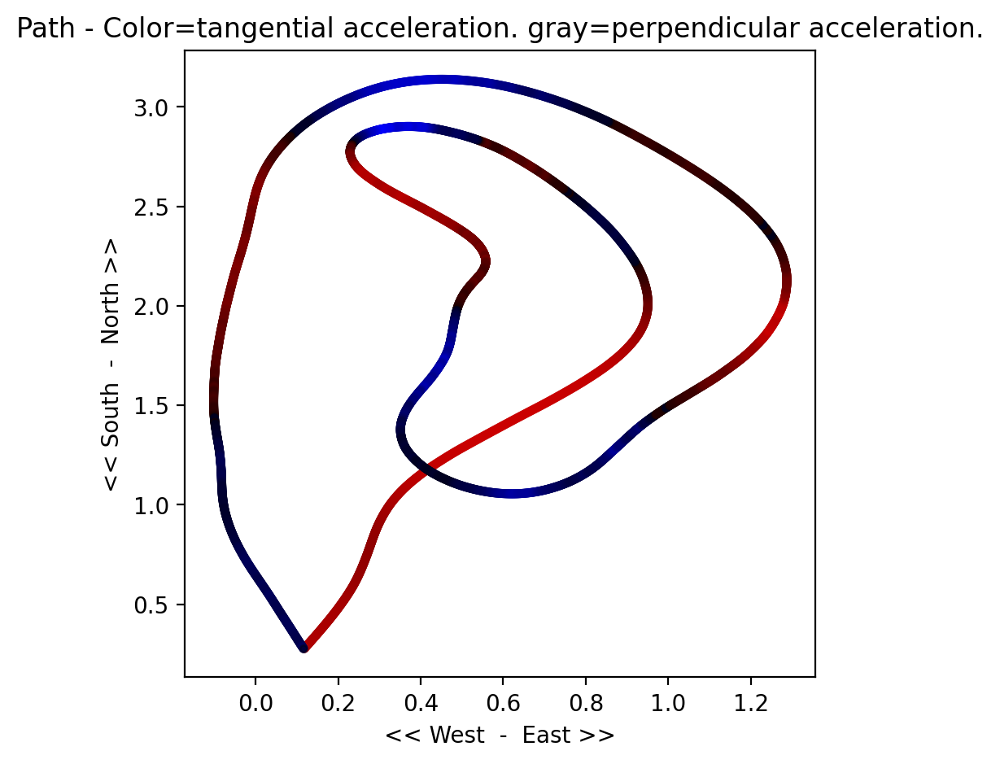

In [ ]:
fig = plt.figure(figsize=(5,5),dpi=200)
ax = fig.add_subplot()
#ax.set_zlim()
print(max(afwd))
fbase=max(max(afwd),abs(min(afwd)))
colors=[(a/fbase*0.9+0.1,0,0) if a>0 else (0,0,-a/fbase*0.9+0.1) for a in afwd]

ax.scatter(xxs[:-1], yys[:-1], marker='.', color=colors, alpha=0.5)

"""
sidex=[x+math.cos(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+math.sin(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidex=[x+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
for i in range(0,len(xxs),50):
  accelside=np.linspace([xxs[i],yys[i]],[sidex[i],sidey[i]],20)
  ax.scatter([x for x,y in accelside], [y for x,y in accelside], marker='.', color='gray', alpha=0.2)
"""
print(aside)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Path - Color=tangential acceleration. gray=perpendicular acceleration.")

plt.show()

0.34118691520629263
0.34118691520629263 -0.4410273460857218
[   0 2083 3439 6300 8543]
0 1282
2215 3217
4786 5526
6659 7696
[0, 0.2217910900589868, 0.2217879022534487, 0.2217841207050784, 0.22177992250349257, 0.22177559178499476, 0.2217714907645879, 0.22176771860108552, 0.22176441426379143, 0.2217616637619045, 0.22175977082332327, 0.22175900294394152, 0.221759693142274, 0.22176206052287428, 0.22176629859705216, 0.22177259543737832, 0.22178097105582706, 0.2217914737117312, 0.2218043159793339, 0.221819826148186, 0.221838160724957, 0.22185951955268227, 0.2218839125456331, 0.22191135586106642, 0.22194173743693996, 0.22197505033246523, 0.22201130578097839, 0.22205059003561123, 0.22209292370733563, 0.22213842105275555, 0.2221872945224999, 0.22223955254891511, 0.22229499874294922, 0.22235345404599982, 0.22241473263380573, 0.2224786747049357, 0.22254509960217594, 0.22261398699185703, 0.22268525585002624, 0.22275856289528773, 0.22283368916572485, 0.22291035156190525, 0.2229883705739361, 0.22306

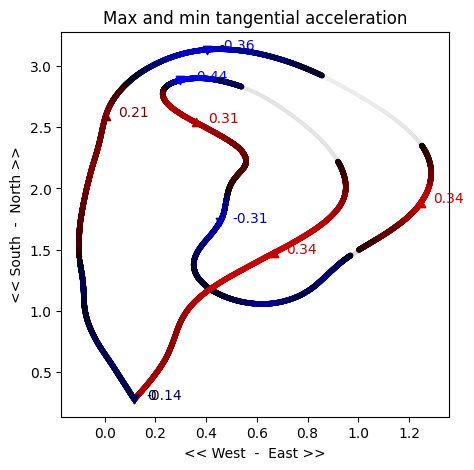

In [ ]:
from scipy.signal import argrelextrema
import numpy as np

df = pd.DataFrame({'afwd':afwd})
# first argument can a multidimentional np array as
# data : ndarray
# Array in which to find the relative extrema.
# This is reflected in what gets returned:
#Returns
#    -------
#    extrema : ndarray
#        Boolean array of the same shape
# That is why at the end of the line we just take the first element
# order: How many points on each side to use for the comparison to consider
ilocs_min = argrelextrema(df.afwd.values, np.less_equal, order=points_in_1s)[0]
ilocs_max = argrelextrema(df.afwd.values, np.greater_equal, order=points_in_1s)[0]



fig = plt.figure(figsize=(5,5),dpi=100)
ax = fig.add_subplot()
#ax.set_zlim()
print(max(afwd))
fbase=max(max(afwd),abs(min(afwd)))

ax.scatter(xxs[:-1], yys[:-1], marker='.', color='black', alpha=0.005)


# filter prices that are peaks and plot them differently to be visable on the plot
amax=max(afwd)
amin=min(afwd)
print(amax,amin)
print(ilocs_min)

v=[math.sqrt(vx*vx+vy*vy) for vx,vy in zip(vxs,vys)]
vbase=max(max(v),abs(min(v)))
vcolors=[(a/vbase*0.9+0.1,0,0) if a>0 else (0,0,-a/vbase*0.9+0.1) for a in v]


for mi in ilocs_min[:5]:
  mistart=mi
  miend=mi
  while afwd[mistart]<0:
    mistart-=1
  while afwd[miend]<0:
    miend+=1

  ax.scatter(xxs[mistart:miend], yys[mistart:miend], marker='.', color=colors[mistart:miend], alpha=1)

for mx in ilocs_max[:5]:
  mxstart=mx
  mxend=mx
  while afwd[mxstart]>0:
    mxstart-=1
  while afwd[mxend]>0:
    mxend+=1
  print(mxstart,mxend)
  ax.scatter(xxs[mxstart:mxend], yys[mxstart:mxend], marker='.', color=colors[mxstart:mxend], alpha=1)


for mi in ilocs_min[:5]:
  ax.scatter(xxs[mi], yys[mi], marker='v', color=(0.0,0.0,abs(afwd[mi])/abs(fbase)), alpha=1.0, label=str(mi))
  ax.annotate(str(round(afwd[mi],2)), xy=(xxs[mi], yys[mi]), xytext=(xxs[mi]+0.05, yys[mi]+0.0),color=(0.0,0.0,abs(afwd[mi])/abs(fbase)),
            arrowprops=dict(facecolor='black', shrink=0.05, alpha=0.0),
            )
for mx in ilocs_max[:5]:
  ax.scatter(xxs[mx], yys[mx], marker='^', color=(abs(afwd[mx])/abs(fbase),0.0,0.0), alpha=1.0, label=str(mx))
  ax.annotate(str(round(afwd[mx],2)), xy=(xxs[mx], yys[mx]), xytext=(xxs[mx]+0.05, yys[mx]+0.0),color=(abs(afwd[mx])/abs(fbase),0,0),
            arrowprops=dict(facecolor='black', shrink=0.05, alpha=0.0),
            )
#df.iloc[ilocs_max].price.plot(style='.', lw=10, color='red', marker="v");
#df.iloc[ilocs_min].price.plot(style='.', lw=10, color='green', marker="^");

"""
sidex=[x+math.cos(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+math.sin(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidex=[x+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
for i in range(0,len(xxs),50):
  accelside=np.linspace([xxs[i],yys[i]],[sidex[i],sidey[i]],20)
  ax.scatter([x for x,y in accelside], [y for x,y in accelside], marker='.', color='gray', alpha=0.2)
"""
print(aside)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Max and min tangential acceleration")

plt.show()

0.34118691520629263
[0, 0.2217910900589868, 0.2217879022534487, 0.2217841207050784, 0.22177992250349257, 0.22177559178499476, 0.2217714907645879, 0.22176771860108552, 0.22176441426379143, 0.2217616637619045, 0.22175977082332327, 0.22175900294394152, 0.221759693142274, 0.22176206052287428, 0.22176629859705216, 0.22177259543737832, 0.22178097105582706, 0.2217914737117312, 0.2218043159793339, 0.221819826148186, 0.221838160724957, 0.22185951955268227, 0.2218839125456331, 0.22191135586106642, 0.22194173743693996, 0.22197505033246523, 0.22201130578097839, 0.22205059003561123, 0.22209292370733563, 0.22213842105275555, 0.2221872945224999, 0.22223955254891511, 0.22229499874294922, 0.22235345404599982, 0.22241473263380573, 0.2224786747049357, 0.22254509960217594, 0.22261398699185703, 0.22268525585002624, 0.22275856289528773, 0.22283368916572485, 0.22291035156190525, 0.2229883705739361, 0.22306746645777856, 0.22314728672864007, 0.22322735558763937, 0.22330737779512744, 0.22338685317090598, 0.2234

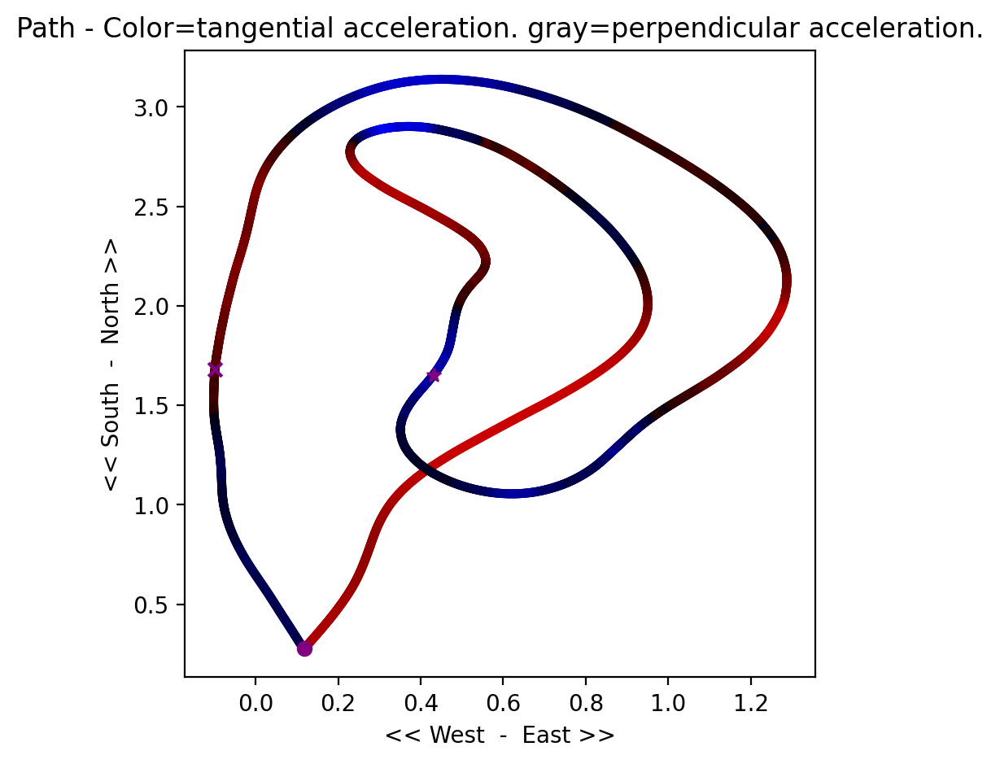

In [ ]:
# Estimate lap markers manually:
laps=[0,3500,7500]


fig = plt.figure(figsize=(5,5),dpi=200)
ax = fig.add_subplot()
#ax.set_zlim()
print(max(afwd))
fbase=max(max(afwd),abs(min(afwd)))
colors=[(a/fbase*0.9+0.1,0,0) if a>0 else (0,0,-a/fbase*0.9+0.1) for a in afwd]

ax.scatter(xxs[:-1], yys[:-1], marker='.', color=colors, alpha=0.5)

"""
sidex=[x+math.cos(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+math.sin(a+math.pi/2)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidex=[x+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+side2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
for i in range(0,len(xxs),50):
  accelside=np.linspace([xxs[i],yys[i]],[sidex[i],sidey[i]],20)
  ax.scatter([x for x,y in accelside], [y for x,y in accelside], marker='.', color='gray', alpha=0.2)
"""
print(aside)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Path - Color=tangential acceleration. gray=perpendicular acceleration.")
print(len(xxs))
ax.scatter(xxs[laps[0]],yys[laps[0]], marker='o', color='purple')
ax.scatter(xxs[laps[1]],yys[laps[1]], marker='*', color='purple')
ax.scatter(xxs[laps[2]],yys[laps[2]], marker='x', color='purple')

plt.show()

2
-------------------------------------
LAP {} 0
max-mean-min
(0.4891068081669391, 0.09150684298925221, -0.1742129775517711)
(0.44352847650326976, 0.07155574897634669, -0.2914051736726612)
(0.11822512415785648, -0.015158095582674455, -0.15708527957847415)
4400
max-mean-min
(0.32187201471672366, -0.01240792227384284, -0.22427201939596803)
(1.1332607912818282, 0.5578955446959566, -0.07292659355977374)
(0.04910131970202602, 0.0016138717198044287, -0.028109382996637098)
[0, 6.238630279522751e-06, 1.4610621254211826e-05, 2.5099766386715996e-05, 3.76896468165635e-05, 5.236288335363028e-05, 6.910046974749855e-05, 8.788155438043828e-05, 0.00010868503910486742, 0.0001314891976572158, 0.00015627263166164917, 0.00018301299940540807, 0.00021168705220666627, 0.00024227002443719662, 0.00027473602302256197, 0.00030905867696135424, 0.0003452112131034429, 0.00038316713008284636, 0.00042289981195116306, 0.0004643820300831266, 0.0005075858325501803, 0.0005524824749361644, 0.0005990417567548461, 0.0006472

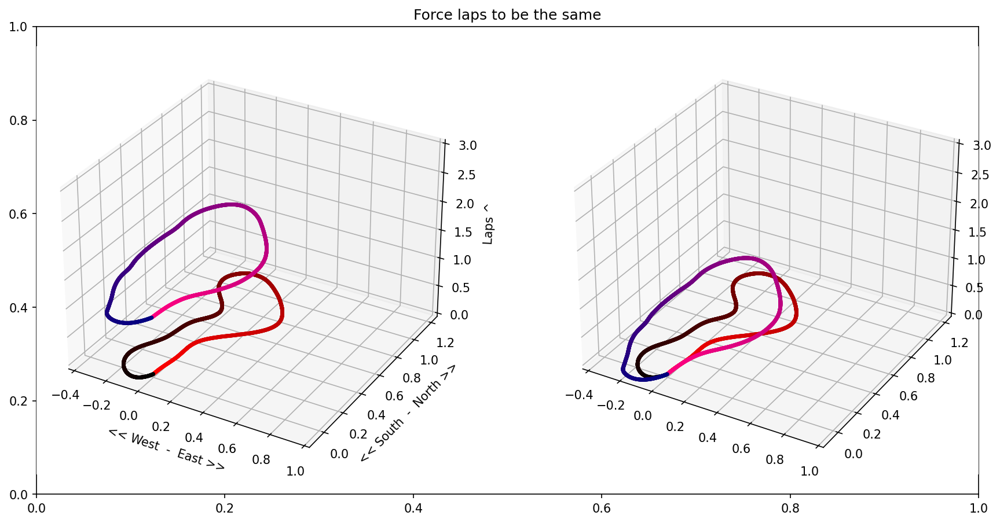

In [ ]:
import time

# Estimate lap markers manually:
laps=[0,4400,useacc["smoothx"].size]


N2S=1/1000.0/1000.0/1000.0
#N2S=1
reset_every=100000000
vdecay=0.99

fig = plt.figure(figsize=(14,7),dpi=150)
plt.title("Force laps to be the same")
ax = fig.add_subplot(1,2,1,projection='3d')
ax2 = fig.add_subplot(1,2,2,projection='3d')

ts=[row for row in useacc["timestamp"]]
xs=[row for row in useacc["smoothx"]]
ys=[row for row in useacc["smoothy"]]
zs=[row for row in useacc["smoothz"]]

minutes=useacc["minutes"]

addacurve=500
laps[-1]=laps[-1]+addacurve
ts=ts[laps[0]:]+[t for t in range(ts[-1],ts[-1]+addacurve*5*1000*1000,5*1000*1000)]
xs=xs[laps[0]:]+xs[laps[1]-addacurve:laps[1]]
ys=ys[laps[0]:]+ys[laps[1]-addacurve:laps[1]]
zs=zs[laps[0]:]+zs[laps[1]-addacurve:laps[1]]
lapstart=laps[0]

afwd=afwd[laps[0]:]+afwd[laps[1]-addacurve:laps[1]]
aside=aside[laps[0]:]+aside[laps[1]-addacurve:laps[1]]
minutes=minutes[laps[0]:]+minutes[laps[1]-addacurve:laps[1]]
rotzzz=useaxis3[laps[0]:]+useaxis3[laps[1]-addacurve:laps[1]]

lapsts=[]
lapsxs=[]
lapsys=[]
lapszs=[]
lapsafwd=[]
lapsaside=[]
lapsminutes=[]
lapsrotz=[]
lapsvxs=[]
lapsvys=[]
lapsvzs=[]

for lapend in laps[1:]:
  lapsts.append(ts[lapstart:lapend])
  lapsxs.append(xs[lapstart:lapend])
  lapsys.append(ys[lapstart:lapend])
  lapszs.append(zs[lapstart:lapend])
  lapsafwd.append(afwd[lapstart:lapend])
  lapsaside.append(aside[lapstart:lapend])
  lapsminutes.append(minutes[lapstart:lapend])
  lapsrotz.append(rotzzz[lapstart:lapend])

  lapstart=lapend

startv=[0,0,0]
startp=[0,0,0]

print(len(lapsts))
for ts,xs,ys,zs,lapnum in zip(lapsts,lapsxs,lapsys,lapszs,range(0,len(laps))):

  print("-------------------------------------")
  print("LAP {}",lapnum)
  print("max-mean-min")
  print((max(xs),mean(xs),min(xs)))
  print((max(ys),mean(ys),min(ys)))
  print((max(zs),mean(zs),min(zs)))


  #ts=range(1,len(ts)*4988334,4988334)
  def decay2(vx,vy,vz):
    return vdecay
    magnitude=math.sqrt(vx*vx+vy*vy+vz*vz)
    m2=magnitude*magnitude
    decay=1000000/(m2+1000000)*vdecay
    return decay

  def dynamic_reset(vx,vy,vz):
    return vx,vy,vz
    magnitude=math.sqrt(vx*vx+vy*vy+vz*vz)
    m2=magnitude*magnitude
    if magnitude>5:
      return vx/2,vy/2,vz/2
      return 0,0,0
    else:
      return vx,vy,vz


  minxy=[0,0]
  maxxy=[1,1]
  print(len(ts))

  #VELOCITY
  def acc2vel(xs,ys,zs):
    xmean=mean(xs)
    ymean=mean(ys)
    zmean=mean(zs)
    vxs=[x-xmean for x in xs]
    vys=[y-ymean for y in ys]
    vzs=[z-zmean for z in zs]

    vxs[0]=startv[0]
    vxs[0]=startv[1]
    vxs[0]=startv[2]

    for i in range(1,len(vxs)):
      vdecay=decay2(xs[i],ys[i],zs[i])
      vxs[i-1]
      vxs[i]
      ts[i-1]
      ts[i]
      vxs[i]=vdecay*vxs[i-1]+vxs[i]*(ts[i]-ts[i-1])*N2S
      vys[i]=vdecay*vys[i-1]+vys[i]*(ts[i]-ts[i-1])*N2S
      vzs[i]=vdecay*vzs[i-1]+vzs[i]*(ts[i]-ts[i-1])*N2S
      if i%reset_every==0:
        print("reset velocity so it doesn't grow unbounded")
        vxs[i]=0.0
        vys[i]=0.0
        vzs[i]=0.0
      x,y,z = dynamic_reset(vxs[i],vys[i],vzs[i])
      vxs[i]=x
      vys[i]=y
      vzs[i]=z

    return vxs,vys,vzs



  #POSITION
  def vel2pos(vxs,vys,vzs):
    vdecay=1
    xmean=mean(vxs)
    ymean=mean(vys)
    zmean=mean(vzs)
    xxs=[x-xmean for x in vxs]
    yys=[y-ymean for y in vys]
    zzs=[z-zmean for z in vzs]
    xxs[0]=startp[0]
    yys[0]=startp[1]
    zzs[0]=startp[2]

    for i in range(1,len(xxs)):
      xxs[i]=vdecay*xxs[i-1]+xxs[i]*(ts[i]-ts[i-1])*N2S

    for i in range(1,len(xxs)):
      yys[i]=vdecay*yys[i-1]+yys[i]*(ts[i]-ts[i-1])*N2S

    for i in range(1,len(xxs)):
      zzs[i]=vdecay*zzs[i-1]+zzs[i]*(ts[i]-ts[i-1])*N2S

    return xxs,yys,zzs

  vxs,vys,vzs = acc2vel(xs,ys,zs)
  xxs,yys,zzs = vel2pos(vxs,vys,vzs)

  minxy=[ min(minxy[0],min(xxs)),min(minxy[1],min(yys))]
  maxxy=[ max(maxxy[0],max(xxs)),max(maxxy[1],max(yys))]

  print("max-mean-min")
  print((max(xxs),mean(xxs),min(xxs)))
  print((max(yys),mean(yys),min(yys)))
  print((max(zzs),mean(zzs),min(zzs)))
  print(xxs[0:100])
  print(yys[0:100])
  print(zzs[0:100])

  zeros=[0.0]*len(xxs)
  colors=['red', 'blue','yellow', 'purple','cyan','magenta','orange']
  colors=colors*10
  colors=['yellow']*len(xxs)
  for i in range(0,len(colors)):
    colors[i]=((len(colors)-i)/len(colors),0,1.0*lapnum/len(lapsxs))


  ax.scatter(xxs, yys, lapnum, marker='.', color=colors, alpha=0.5)
  ax2.scatter(xxs, yys, 0, marker='.', color=colors, alpha=0.5)

  startv=[vxs[-1],vys[-1],vzs[-1]]
  startp=[xxs[-1],yys[-1],zzs[-1]]
  print(startp)
  print(startv)
  print("vdecay ratio to v and a",vdecay/mean([math.sqrt(x*x+y*y) for x,y in zip(vxs,vys)]),vdecay/mean([math.sqrt(x*x+y*y) for x,y in zip(xs,ys)]))

  lapsvxs.append(vxs)
  lapsvys.append(vys)
  lapsvzs.append(vzs)


ax.set_xlim(minxy[0],maxxy[0])
ax.set_ylim(minxy[1],maxxy[1])
ax2.set_xlim(minxy[0],maxxy[0])
ax2.set_ylim(minxy[1],maxxy[1])

ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')
ax.set_zlabel('Laps ^')
ax.set_zlim(0,len(laps))
ax2.set_zlim(0,len(laps))
plt.show()

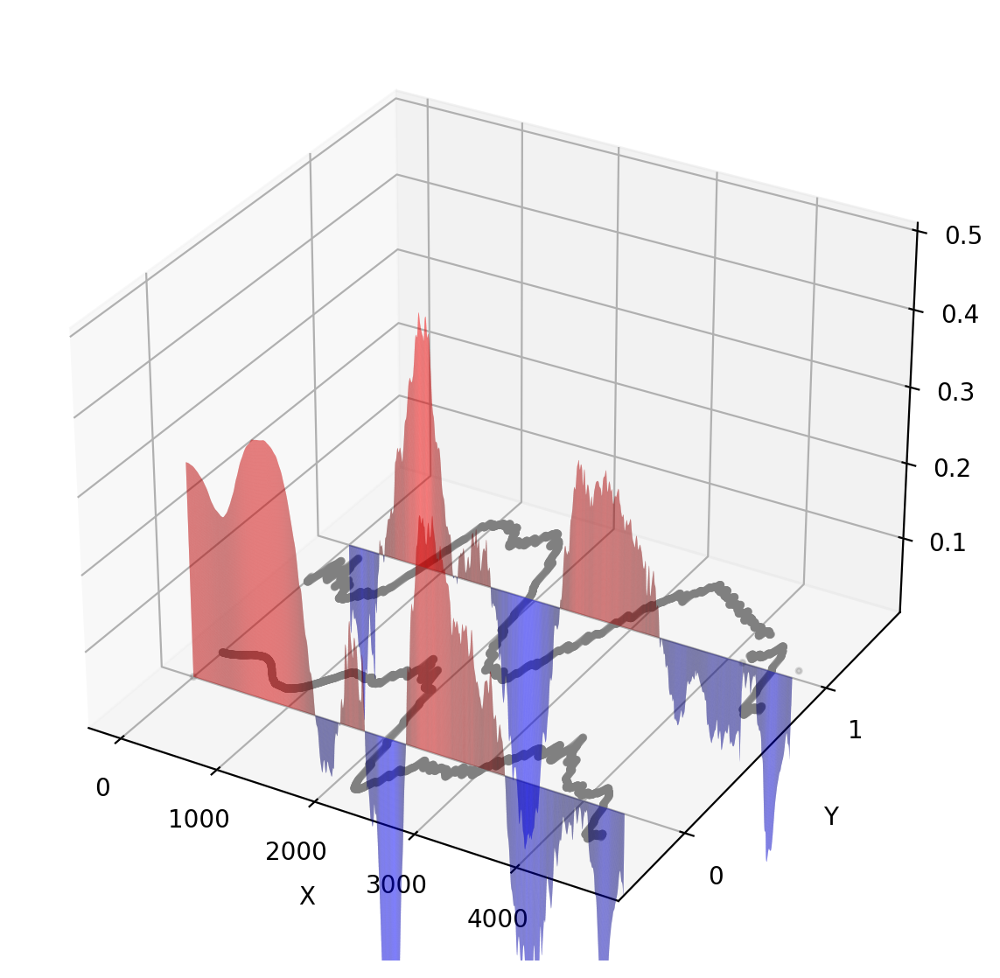

In [ ]:
fig = plt.figure(figsize=(14,7),dpi=200)
ax = fig.add_subplot(projection='3d')


yticks = range(0,len(lapsxs))
for lapnum in yticks:
    fbase=max(max(lapsafwd[lapnum]),abs(min(lapsafwd[lapnum])))
    colors=[(a/fbase*0.7+0.3,0,0) if a>0 else (0,0,-a/fbase*0.7+0.3) for a in lapsafwd[lapnum]]

    z=round(lapnum*max(max([abs(z) for z in lapsaside[lapnum]])*4,1)+1)
    maxy=max([abs(y) for y in lapsaside[lapnum]])
    y=[y/maxy/2+lapnum for y in lapsaside[lapnum]]
    ax.bar(range(0,len(lapsafwd[lapnum])), lapsafwd[lapnum], lapnum, zdir='y', color=colors, alpha=0.8)
    ax.scatter(range(0,len(lapsaside[lapnum])), y, 0, color='gray', alpha=0.3, marker='.')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# On the y-axis let's only label the discrete values that we have data for.
ax.set_yticks(yticks)
ax.set_zlim(0.01,0.5)

plt.show()

In [ ]:
# library
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.path as path
import matplotlib.patches as patches

lapsminutes[-1]=lapsminutes[-1][0:len(lapsafwd[-1])]
yticks = range(0,len(lapsxs))
fig = plt.figure(figsize=(20,5),dpi=200)
axs = fig.subplots(len(lapsxs))

for lapnum in yticks:
    fbase=max(max(lapsafwd[lapnum]),abs(min(lapsafwd[lapnum])))
    colors=[(a/fbase*0.7+0.3,0,0) if a>0 else (0,0,-a/fbase*0.7+0.3) for a in lapsafwd[lapnum]]
    tmin=min(lapsminutes[lapnum])
    x=[(t-tmin)*60 for t in lapsminutes[lapnum]]
    for xxxx,yyyy,cccc in zip(x,lapsafwd[lapnum],colors):
        bar=np.linspace(0,yyyy,20)
        axs[lapnum].scatter([xxxx]*20, bar, color=cccc,alpha=0.5,marker='.')
    axs[lapnum].scatter(x, lapsafwd[lapnum], color=colors,alpha=1,marker='.')
    axs[lapnum].grid()

plt.show()


KeyboardInterrupt: ignored

Error in callback <function flush_figures at 0x7f8f20fc1940> (for post_execute):


KeyboardInterrupt: ignored

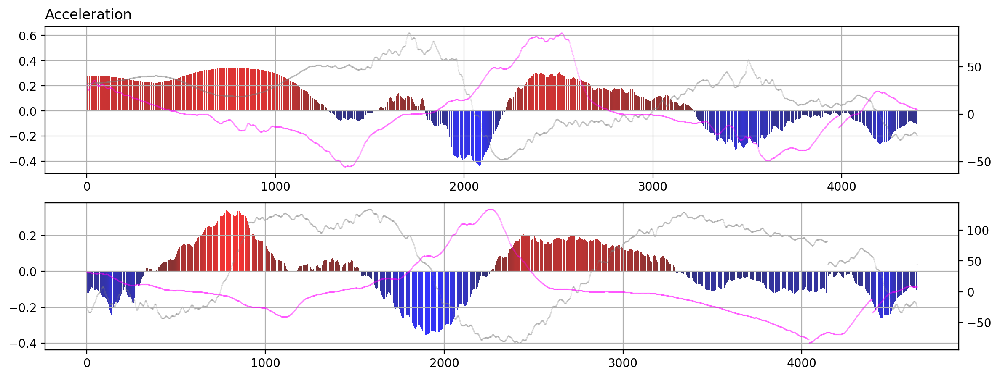

In [ ]:
fig = plt.figure(figsize=(14,5),dpi=200)
#plt.title('Acceleration')
axs = fig.subplots(len(lapsxs))



yticks = range(0,len(lapsxs))
for lapnum in yticks:
    r=[(r-lapsrotz[lapnum][0])/math.pi*180 for r in lapsrotz[lapnum]]
    ax2 = axs[lapnum].twinx()
    #ax2.scatter(range(0,len(lapsrotz[lapnum])),r, color='purple', alpha=0.3, marker='.', s=0.1, label='rotation')
    #ax2.set_yticks([0,90,180,270,360])

    r=[r-tilt for r,tilt in zip(r,np.linspace(min(r),max(r),len(r)))]
    meanr=mean(r)
    maxr=max(r)
    r=[(r-meanr)*abs(r-meanr)/(90) for r in r]
    ax2.scatter(range(0,len(lapsrotz[lapnum])),r, color='magenta', alpha=0.3, marker='.', s=0.1, label='rotation')

    fbase=max(max(lapsafwd[lapnum]),abs(min(lapsafwd[lapnum])))
    colors=[(a/fbase*0.7+0.3,0,0) if a>0 else (0,0,-a/fbase*0.7+0.3) for a in lapsafwd[lapnum]]


    maxy=max([abs(y) for y in lapsaside[lapnum]])
    y=[y/maxy/2+lapnum for y in lapsaside[lapnum]]
    tmin=min(lapsminutes[lapnum])
    t=[(t-tmin)*60 for t in lapsminutes[lapnum]]

    axs[lapnum].bar(range(0,len(lapsafwd[lapnum])), lapsafwd[lapnum], color=colors, alpha=0.8, label='forward (tangent)')
    axs[lapnum].scatter(range(0,len(lapsaside[lapnum])), lapsaside[lapnum], color='gray', alpha=0.3, marker='.', s=0.1, label='turn (perpendicular)')


    axs[lapnum].grid()
    if lapnum==0:
      plt.title('Acceleration', loc='left')

#plt.set_xlabel('seconds')


plt.show()

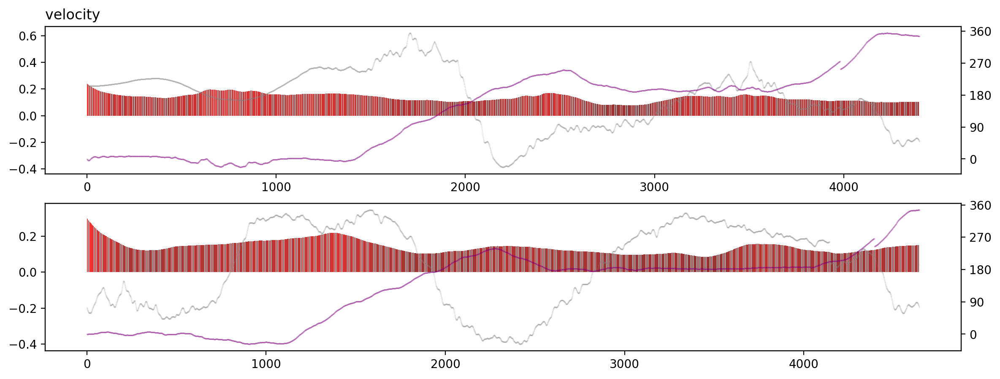

In [ ]:
fig = plt.figure(figsize=(14,5),dpi=200)
axs = fig.subplots(len(lapsvxs))



yticks = range(0,len(lapsvxs))
for lapnum in yticks:
    v = [math.sqrt(x*x+y*y) for x,y in zip(lapsvxs[lapnum],lapsvys[lapnum])]
    fbase=max(v)
    colors=[(a/fbase*0.7+0.3,0,0) if a>0 else (0,0,-a/fbase*0.7+0.3) for a in v]

    maxy=max([abs(y) for y in v])
    y=[y/maxy/2+lapnum for y in lapsaside[lapnum]]
    tmin=min(lapsminutes[lapnum])
    t=[(t-tmin)*60 for t in lapsminutes[lapnum]]

    axs[lapnum].bar(range(0,len(v)), v, color=colors, alpha=0.8, label='forward (tangent)')
    axs[lapnum].scatter(range(0,len(lapsaside[lapnum])), lapsaside[lapnum], color='gray', alpha=0.3, marker='.', s=0.1, label='turn (perpendicular)')
    r=[(r-lapsrotz[lapnum][0])/math.pi*180 for r in lapsrotz[lapnum]]
    ax2 = axs[lapnum].twinx()
    ax2.scatter(range(0,len(lapsrotz[lapnum])),r, color='purple', alpha=0.3, marker='.', s=0.1, label='rotation')
    ax2.set_yticks([0,90,180,270,360])
    axs[lapnum].grid()
    axs[lapnum].grid()
    if lapnum==0:
      plt.title('velocity', loc='left')
#plt.set_xlabel('seconds')


plt.show()

In [ ]:
print(useacc.head(230))

             timestamp                 sensortype         x         y         z   zz  quality  zz2  normindex                   timecolor  ...  timedelta   smoothx   smoothy   smoothz        vx  \
6067  1000974476486817  Earth.Linear_Acceleration  0.055062  0.048203 -1.446034  0.0      0.0  0.0   0.114331  (0.8856685197399415, 0, 0)  ...   0.004988  0.177553  0.312589  0.023680  0.118348   
6075  1000974481475254  Earth.Linear_Acceleration -0.018910  0.065631 -1.450428  0.0      0.0  0.0   0.114482  (0.8855177612362197, 0, 0)  ...   0.004988  0.177843  0.312512  0.023135  0.118348   
6079  1000974486463692  Earth.Linear_Acceleration -0.067971  0.122069 -1.433775  0.0      0.0  0.0   0.114558  (0.8854423819843588, 0, 0)  ...   0.004988  0.178101  0.312507  0.022610  0.118349   
6085  1000974491452129  Earth.Linear_Acceleration -0.147384  0.174198 -1.396172  0.0      0.0  0.0   0.114671  (0.8853293131065674, 0, 0)  ...   0.004988  0.178307  0.312561  0.022134  0.118352   
6090  100097449

In [ ]:
window_size

1101

In [ ]:
alldata["seconds"].diff()


0             NaN
1        0.004988
2        0.004988
3        0.004988
4        0.004988
           ...   
53060    0.001246
53061   -0.009979
53062    0.004988
53063    0.004988
53064    0.000000
Name: seconds, Length: 53065, dtype: float64

In [ ]:
alldata["seconds"].diff()


0             NaN
1        0.004988
2        0.004988
3        0.004988
4        0.004988
           ...   
53060    0.001246
53061   -0.009979
53062    0.004988
53063    0.004988
53064    0.000000
Name: seconds, Length: 53065, dtype: float64

In [ ]:
alldata["timedelta"] = alldata["seconds"].diff()


<Axes: >

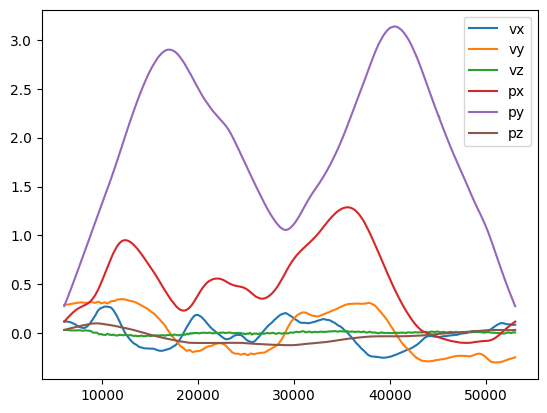

In [ ]:
useacc[["vx","vy","vz","px","py","pz"]].plot()

<Axes: >

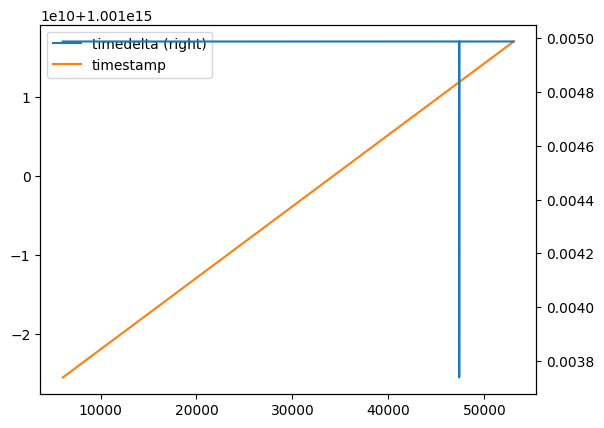

In [ ]:

useacc[["timedelta","timestamp"]].plot(secondary_y=["timedelta"])

In [ ]:
useacc

,timestamp,sensortype,x,y,z,zz,quality,zz2,normindex,timecolor,...,timedelta,smoothx,smoothy,smoothz,vx,vy,vz,px,py,pz
6067,1000974476486817,Earth.Linear_Acceleration,0.055062,0.048203,-1.446034,0.0,0.0,0.0,0.114331,"(0.8856685197399415, 0, 0)",...,0.004988,0.177553,0.312589,0.023680,0.118348,0.288440,0.031595,0.117567,0.275910,0.030979
6075,1000974481475254,Earth.Linear_Acceleration,-0.018910,0.065631,-1.450428,0.0,0.0,0.0,0.114482,"(0.8855177612362197, 0, 0)",...,0.004988,0.177843,0.312512,0.023135,0.118348,0.288436,0.031592,0.118153,0.277286,0.031134
6079,1000974486463692,Earth.Linear_Acceleration,-0.067971,0.122069,-1.433775,0.0,0.0,0.0,0.114558,"(0.8854423819843588, 0, 0)",...,0.004988,0.178101,0.312507,0.022610,0.118349,0.288432,0.031587,0.118740,0.278662,0.031288
6085,1000974491452129,Earth.Linear_Acceleration,-0.147384,0.174198,-1.396172,0.0,0.0,0.0,0.114671,"(0.8853293131065674, 0, 0)",...,0.004988,0.178307,0.312561,0.022134,0.118352,0.288429,0.031579,0.119326,0.280039,0.031443
6090,1000974496440567,Earth.Linear_Acceleration,-0.184551,0.210619,-1.345057,0.0,0.0,0.0,0.114765,"(0.8852350890417413, 0, 0)",...,0.004988,0.178498,0.312671,0.021697,0.118355,0.288426,0.031569,0.119913,0.281415,0.031597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53035,1001017081254213,Earth.Linear_Acceleration,-0.741774,0.057822,-1.466737,0.0,0.0,0.0,0.999435,"(0.0005653443889569454, 0, 0)",...,0.004988,0.157140,-0.186976,-0.024858,0.084576,-0.250112,0.005627,0.115321,0.280074,0.030723
53042,1001017086242650,Earth.Linear_Acceleration,-0.875322,-0.066884,-1.682022,0.0,0.0,0.0,0.999567,"(0.0004334306982003433, 0, 0)",...,0.004988,0.156451,-0.187094,-0.026563,0.084638,-0.249915,0.005506,0.115739,0.278765,0.030747
53047,1001017091231088,Earth.Linear_Acceleration,-1.028815,-0.186141,-1.857460,0.0,0.0,0.0,0.999661,"(0.00033920663337416723, 0, 0)",...,0.004988,0.155538,-0.187482,-0.028532,0.084696,-0.249721,0.005376,0.116158,0.277457,0.030771
53054,1001017096219525,Earth.Linear_Acceleration,-1.143885,-0.226895,-1.944682,0.0,0.0,0.0,0.999793,"(0.00020729294261756515, 0, 0)",...,0.004988,0.154547,-0.187901,-0.030578,0.084748,-0.249530,0.005236,0.116577,0.276150,0.030794
